# Segmentation Subsetting Notebook

## Introduction
This notebook contains the Feature Selection and NaN handling for the Demographic data.  
It will be the base for the preprocessing steps taken.  

In this stage, one of the most important parts is feature selection for clustering, since there are many possible variables.  
Selecting the most important features will help us avoid the "curse of dimensionality" for clustering and also help gain computation time.

## Steps contained
1. Missing values handling
2. Duplicates check/ handling
3. Feature Selection 
    - Too unpopulated columns
    - Multicolinearities (Using Cramer's V)
    - Manual exclusion of variables not relevant based on their definition and description
4. Exploring Corrletions
    - Correlations might happen on variables outside their groups
5. Exploring Distributions
    - It might be more interesting to some variables to encode them differently
    - There are some columns within groups that seem to share information

**Note: To select manually the variables that will be kept, the informations in the DIAS Information Levels - Attributes Spreadsheet will be used** 

## Context/ Business Goal
The targeted company for this project is an **Organics** company that is selling **mail-ordered** products.

# Imports

In [5]:
# Data Wrangling
import pandas as pd
import numpy as np

import csv

# Data Viz
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
sns.set(rc={'figure.figsize':(10,5)})

# Reading Data

In [8]:
census = pd.read_csv('data/raw/Udacity_AZDIAS_052018.csv', sep = ';')

C:\Users\Lucca\AppData\Local\Temp\ipykernel_12864\1330055611.py:1: DtypeWarning: Columns (18,19) have mixed types. Specify dtype option on import or set low_memory=False.
  census = pd.read_csv('data/raw/Udacity_AZDIAS_052018.csv', sep = ';')


In [9]:
census.shape

(891221, 366)

# Utils

In [10]:
def fetch_info_level_columns(df_att_info,df_data,lvl_name):

    all_names = df_att_info[df_att_info['Information level'] == lvl_name]['Attribute'].values

    names_in_data = np.intersect1d(df_data.columns, all_names)

    return names_in_data

In [11]:
def count_val_in_cols(df, col_list, plot_count = False,**count_kwargs):

    '''
    Counts values in each categories for a group of columns in a dataset.
    Has the option to plot these distributions.

    :param df: DataFrame with columns to be counted
    :param col_list: List of column names that will be counted
    :param plot_count: Boolean indicating if resuls should be displayed as graphs (True) or as regular prints (False)
    :param **count_kwargs: Pandas' .value_counts() method key-word arguments
    '''

    for col in col_list:

        val_count = df[col].value_counts(**count_kwargs)

        if plot_count:
            
            g = sns.barplot(data = val_count.reset_index(),
                        x = 'index',
                        y = col)
            
            g.bar_label(g.containers[-1], fmt = '%.2f')
            
            plt.title(f'Variable = {col}')
            
            plt.show()
            
        else:

            print(val_count, end = '\n\n')

# Type handling on warned columns by Pandas

In [12]:
col_check = census.iloc[:, [18,19]].applymap(type)

In [13]:
census.iloc[:, [18,19]].head(10)

,CAMEO_DEUG_2015,CAMEO_INTL_2015
0,NaN,NaN
1,8.0,51.0
2,4.0,24.0
3,2.0,12.0
4,6.0,43.0
5,8.0,54.0
6,4.0,22.0
7,2.0,14.0
8,1.0,13.0
9,1.0,15.0


Probably, what is happening for these columns is that not encoded NaN Values are making pandas read the file as `float`.  
This will be temporarily fixed, so the columns can be preprocessed along with the others.  

In [14]:
col_check[col_check['CAMEO_DEUG_2015'] != float]

,CAMEO_DEUG_2015,CAMEO_INTL_2015
2048,<class 'str'>,<class 'str'>
2050,<class 'str'>,<class 'str'>
2052,<class 'str'>,<class 'str'>
2053,<class 'str'>,<class 'str'>
2054,<class 'str'>,<class 'str'>
...,...,...
886779,<class 'str'>,<class 'str'>
886780,<class 'str'>,<class 'str'>
886781,<class 'str'>,<class 'str'>
886782,<class 'str'>,<class 'str'>


In [15]:
census[census['CAMEO_DEUG_2015'] == 'X'][['CAMEO_DEUG_2015','CAMEO_INTL_2015','CAMEO_DEU_2015']].drop_duplicates()

,CAMEO_DEUG_2015,CAMEO_INTL_2015,CAMEO_DEU_2015
2511,X,XX,XX


'X's will be treated as `NaN`

In [16]:
census['CAMEO_DEUG_2015'] = census['CAMEO_DEUG_2015'].replace('X',np.nan)

census['CAMEO_INTL_2015'] = census['CAMEO_INTL_2015'].replace('XX',np.nan)

census['CAMEO_DEU_2015'] = census['CAMEO_DEU_2015'].replace('XX',np.nan)

In [17]:
census['CAMEO_DEUG_2015'] = census['CAMEO_DEUG_2015'].fillna(-1).astype(int)

census['CAMEO_INTL_2015'] = census['CAMEO_INTL_2015'].fillna(-1).astype(int)

census['CAMEO_DEU_2015'] = census['CAMEO_DEU_2015'].fillna('-1')

In [18]:
census.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891221 entries, 0 to 891220
Columns: 366 entries, LNR to ALTERSKATEGORIE_GROB
dtypes: float64(267), int32(2), int64(93), object(4)
memory usage: 2.4+ GB


# Column names in documentation
Types were manually assigned to each variable in the Values Spreadsheet. The values to be translated to NaN are also dependant on this information.  
However, some column names do not match between data and documentation, this will be fixed

## Attributes
Attaches column name to data type and NaN Value encoding

In [19]:
dim_columns = pd.read_excel('data/raw/DIAS Attributes - Values 2017.xlsx',
                             sheet_name='Tabelle1',
                             usecols = 'B:F',
                             header=1)

In [20]:
documented_cols = dim_columns['Attribute'].dropna().unique()

In [21]:
cols_not_in_docs = np.setdiff1d(census.columns,documented_cols)

In [22]:
print('Columns in data not found in the docs:\n', cols_not_in_docs)

Columns in data not found in the docs:
 ['AKT_DAT_KL' 'ALTERSKATEGORIE_FEIN' 'ALTER_KIND1' 'ALTER_KIND2'
 'ALTER_KIND3' 'ALTER_KIND4' 'ANZ_KINDER' 'ANZ_STATISTISCHE_HAUSHALTE'
 'ARBEIT' 'CAMEO_INTL_2015' 'CJT_KATALOGNUTZER' 'CJT_TYP_1' 'CJT_TYP_2'
 'CJT_TYP_3' 'CJT_TYP_4' 'CJT_TYP_5' 'CJT_TYP_6' 'D19_BANKEN_DIREKT'
 'D19_BANKEN_GROSS' 'D19_BANKEN_LOKAL' 'D19_BANKEN_REST'
 'D19_BEKLEIDUNG_GEH' 'D19_BEKLEIDUNG_REST' 'D19_BILDUNG' 'D19_BIO_OEKO'
 'D19_BUCH_CD' 'D19_DIGIT_SERV' 'D19_DROGERIEARTIKEL' 'D19_ENERGIE'
 'D19_FREIZEIT' 'D19_GARTEN' 'D19_HANDWERK' 'D19_HAUS_DEKO'
 'D19_KINDERARTIKEL' 'D19_KONSUMTYP_MAX' 'D19_KOSMETIK' 'D19_LEBENSMITTEL'
 'D19_LETZTER_KAUF_BRANCHE' 'D19_LOTTO' 'D19_NAHRUNGSERGAENZUNG'
 'D19_RATGEBER' 'D19_REISEN' 'D19_SAMMELARTIKEL' 'D19_SCHUHE'
 'D19_SONSTIGE' 'D19_SOZIALES' 'D19_TECHNIK' 'D19_TELKO_MOBILE'
 'D19_TELKO_ONLINE_QUOTE_12' 'D19_TELKO_REST' 'D19_TIERARTIKEL'
 'D19_VERSAND_REST' 'D19_VERSICHERUNGEN' 'D19_VERSI_DATUM'
 'D19_VERSI_OFFLINE_DATUM' 'D19_VERS

## Fixing the most obvious matches with documented informations

In [23]:
d19_name_map = {}

antg_cols_rename = {}

# D19 columns
for i, col in enumerate(cols_not_in_docs):

    if col.startswith('D19') and ('DATUM' not in col) and ('QUOTE' not in col):
        
        d19_name_map[col] = col + '_RZ'

In [24]:
other_cols_rename = {'CAMEO_INTL_2015':'CAMEO_DEUINTL_2015',
                    'SOHO_KZ':'SOHO_FLAG',
                    'KK_KUNDENTYP':'D19_KK_KUNDENTYP',
                    'KBA13_CCM_1401_2500':'KBA13_CCM_1400_2500'}

In [25]:
census.rename(columns = d19_name_map, inplace = True)

census.rename(columns = other_cols_rename, inplace = True)

In [26]:
# Remaining columns
cols_not_in_docs = np.setdiff1d(census.columns,documented_cols)

In [27]:
print('Remaining columns not found in documentation:\n')
sorted(cols_not_in_docs)

Remaining columns not found in documentation:



['AKT_DAT_KL',
 'ALTERSKATEGORIE_FEIN',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'ANZ_KINDER',
 'ANZ_STATISTISCHE_HAUSHALTE',
 'ARBEIT',
 'CJT_KATALOGNUTZER',
 'CJT_TYP_1',
 'CJT_TYP_2',
 'CJT_TYP_3',
 'CJT_TYP_4',
 'CJT_TYP_5',
 'CJT_TYP_6',
 'D19_BUCH_CD_RZ',
 'D19_KONSUMTYP_MAX_RZ',
 'D19_LETZTER_KAUF_BRANCHE_RZ',
 'D19_SOZIALES_RZ',
 'D19_TELKO_ONLINE_QUOTE_12',
 'D19_VERSI_DATUM',
 'D19_VERSI_OFFLINE_DATUM',
 'D19_VERSI_ONLINE_DATUM',
 'D19_VERSI_ONLINE_QUOTE_12',
 'DSL_FLAG',
 'EINGEFUEGT_AM',
 'EINGEZOGENAM_HH_JAHR',
 'EXTSEL992',
 'FIRMENDICHTE',
 'GEMEINDETYP',
 'HH_DELTA_FLAG',
 'KBA13_ANTG1',
 'KBA13_ANTG2',
 'KBA13_ANTG3',
 'KBA13_ANTG4',
 'KBA13_BAUMAX',
 'KBA13_GBZ',
 'KBA13_HHZ',
 'KBA13_KMH_210',
 'KOMBIALTER',
 'KONSUMZELLE',
 'LNR',
 'MOBI_RASTER',
 'RT_KEIN_ANREIZ',
 'RT_SCHNAEPPCHEN',
 'RT_UEBERGROESSE',
 'STRUKTURTYP',
 'UMFELD_ALT',
 'UMFELD_JUNG',
 'UNGLEICHENN_FLAG',
 'VERDICHTUNGSRAUM',
 'VHA',
 'VHN',
 'VK_DHT4A',
 'VK_DISTANZ',
 'VK_ZG

Some of the columns not in the docs cannot have their meaning infered (by their name) as well unknown values.  
These will be dropped to avoid unmapped empty values skewing distributions. 

In [28]:
# Columns not found after manual inspection
not_found_cols = ['AKT_DAT_KL',
                    'DSL_FLAG',
                    'EINGEFUEGT_AM',
                    'EINGEZOGENAM_HH_JAHR',
                    'EXTSEL992',
                    'FIRMENDICHTE',
                    'GEMEINDETYP',
                    'HH_DELTA_FLAG',
                    'KBA13_BAUMAX',
                    'KBA13_GBZ',
                    'KBA13_HHZ',
                    'KOMBIALTER',
                    'KONSUMZELLE',
                    'MOBI_RASTER',
                    'RT_KEIN_ANREIZ',
                    'RT_SCHNAEPPCHEN',
                    'RT_UEBERGROESSE',
                    'STRUKTURTYP',
                    'UMFELD_ALT',
                    'UMFELD_JUNG',
                    'UNGLEICHENN_FLAG',
                    'VERDICHTUNGSRAUM',
                    'VHA',
                    'VHN',
                    'VK_DHT4A',
                    'VK_DISTANZ',
                    'VK_ZG11',
                    'KBA13_ANTG1',
                    'KBA13_ANTG2',
                    'KBA13_ANTG3',
                    'KBA13_ANTG4']

In [29]:
census.drop(columns = not_found_cols, inplace = True)

In [30]:
cols_not_in_docs = np.setdiff1d(cols_not_in_docs, not_found_cols)

In [31]:
print('Remaining columns that can be infered via context:')
cols_not_in_docs

Remaining columns that can be infered via context:


array(['ALTERSKATEGORIE_FEIN', 'ALTER_KIND1', 'ALTER_KIND2',
       'ALTER_KIND3', 'ALTER_KIND4', 'ANZ_KINDER',
       'ANZ_STATISTISCHE_HAUSHALTE', 'ARBEIT', 'CJT_KATALOGNUTZER',
       'CJT_TYP_1', 'CJT_TYP_2', 'CJT_TYP_3', 'CJT_TYP_4', 'CJT_TYP_5',
       'CJT_TYP_6', 'D19_BUCH_CD_RZ', 'D19_KONSUMTYP_MAX_RZ',
       'D19_LETZTER_KAUF_BRANCHE_RZ', 'D19_SOZIALES_RZ',
       'D19_TELKO_ONLINE_QUOTE_12', 'D19_VERSI_DATUM',
       'D19_VERSI_OFFLINE_DATUM', 'D19_VERSI_ONLINE_DATUM',
       'D19_VERSI_ONLINE_QUOTE_12', 'KBA13_KMH_210', 'LNR'], dtype=object)

These columns will be kept

## Information levels
Attaches column name to variable group

In [32]:
att_info = pd.read_excel('data/raw/DIAS Information Levels - Attributes 2017.xlsx',
                         usecols = ['Information level','Attribute'],
                         header = 1,
                         sheet_name = 'info_group')

In [33]:
att_info['Information level'] = att_info['Information level'].fillna(method='ffill')\
                                                            .fillna(method='backfill')

In [34]:
att_info['Information level'].unique()

array(['Person', 'Household', 'Building', 'Microcell (RR4_ID)',
       'Microcell (RR3_ID)', '125m x 125m Grid', 'Postcode ', 'RR1_ID',
       'PLZ8', 'Community'], dtype=object)

In [35]:
att_info['Information level'] = att_info['Information level'].str.strip()

In [36]:
att_info['Information level'].nunique()

10

In [37]:
att_info = att_info[['Information level','Attribute']]

display(att_info)

,Information level,Attribute
0,Person,AGER_TYP
1,Person,ALTERSKATEGORIE_GROB
2,Person,ANREDE_KZ
3,Person,CJT_GESAMTTYP
4,Person,FINANZ_MINIMALIST
...,...,...
308,Community,ARBEIT
309,Community,EINWOHNER
310,Community,GKZ
311,Community,ORTSGR_KLS9


In [38]:
# Fixing the names for 125 grid because in the data they dont have _RZ in their name
# att_info['Attribute'] = att_info['Attribute'].str.replace('_RZ','')

In [39]:
diff_cols = list(np.setdiff1d(census.columns.values, att_info['Attribute'].values))

print(diff_cols)

['ALTERSKATEGORIE_FEIN', 'ALTER_KIND1', 'ALTER_KIND2', 'ALTER_KIND3', 'ALTER_KIND4', 'ANZ_KINDER', 'ANZ_STATISTISCHE_HAUSHALTE', 'CJT_KATALOGNUTZER', 'CJT_TYP_1', 'CJT_TYP_2', 'CJT_TYP_3', 'CJT_TYP_4', 'CJT_TYP_5', 'CJT_TYP_6', 'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24', 'D19_BUCH_CD_RZ', 'D19_GESAMT_ANZ_12', 'D19_GESAMT_ANZ_24', 'D19_KONSUMTYP_MAX_RZ', 'D19_LETZTER_KAUF_BRANCHE_RZ', 'D19_LOTTO_RZ', 'D19_SOZIALES_RZ', 'D19_TELKO_ANZ_12', 'D19_TELKO_ANZ_24', 'D19_TELKO_ONLINE_QUOTE_12', 'D19_VERSAND_ANZ_12', 'D19_VERSAND_ANZ_24', 'D19_VERSI_ANZ_12', 'D19_VERSI_ANZ_24', 'D19_VERSI_ONLINE_QUOTE_12', 'KBA13_CCM_3000', 'KBA13_CCM_3001', 'KBA13_KMH_210', 'LNR']


Not all variables are described in the Information Levels.

In [40]:
# Removing ID
diff_cols.remove('LNR')

Even though these columns are not assigned to any information group, the majority has a prefix that helps manually assigning them to a group.

In [41]:
grid_cols = ['D19_BUCH_CD_RZ',
            'D19_LETZTER_KAUF_BRANCHE_RZ',
            'D19_LOTTO_RZ',
            'D19_SOZIALES_RZ']

In [42]:
household_cols = ['D19_TELKO_ONLINE_QUOTE_12',
                    'D19_VERSAND_ANZ_12',
                    'D19_VERSAND_ANZ_24',
                    'D19_VERSI_ONLINE_QUOTE_12',
                    'D19_GESAMT_ANZ_12',
                    'D19_GESAMT_ANZ_24',
                    'D19_KONSUMTYP_MAX',
                    'D19_BANKEN_ANZ_12',
                    'D19_BANKEN_ANZ_24',
                    'D19_TELKO_ANZ_12',
                    'D19_TELKO_ANZ_24',
                    'D19_VERSI_ANZ_12',
                    'D19_VERSI_ANZ_24']

### Fixing columns that respect the name structure and/or are in the documentation

In [43]:
new_rows = []

for col in diff_cols:

    if col in household_cols:

        new_val = ('Household', col)

        new_rows.append(new_val)

    if col in grid_cols:

        new_val = ('125m x 125m Grid', col)

        new_rows.append(new_val)

    if col.startswith('KBA13'):

        new_val = ('PLZ8',col)

        new_rows.append(new_val)

    if col.startswith('CJT'):

        new_val = ('Person',col)

        new_rows.append(new_val)

for _, name in new_rows:

    diff_cols.remove(name)

In [44]:
diff_cols

['ALTERSKATEGORIE_FEIN',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'ANZ_KINDER',
 'ANZ_STATISTISCHE_HAUSHALTE',
 'D19_KONSUMTYP_MAX_RZ']

In [45]:
np.setdiff1d(diff_cols, census.columns)

array([], dtype='<U26')

Some columns still are to be accounted for. This will be done by manually inspecting each case to check if the columns exist in the dictionary or have problems in their name.

In [46]:
# # Exporting column names for classification (manual)

# with open('data/raw/unaccounted_cols.csv','w', newline='') as file:

#     writer = csv.writer(file, delimiter=';')

#     writer.writerow(['col_name'])

#     for col in diff_cols:

#         writer.writerow([col])

### Building final classification

In [47]:
# Ingesting after manual inspection
diff_cols_remainder = pd.read_csv('data/trusted/unaccounted_cols.csv', sep = ';')

In [48]:
print('Columns unaccounted for:',diff_cols_remainder.shape[0])

Columns unaccounted for: 8


In [49]:
diff_cols_remainder

,col_name,information
0,ALTERSKATEGORIE_FEIN,Person
1,ALTER_KIND1,Household
2,ALTER_KIND2,Household
3,ALTER_KIND3,Household
4,ALTER_KIND4,Household
5,ANZ_KINDER,Household
6,ANZ_STATISTISCHE_HAUSHALTE,Household
7,D19_KONSUMTYP_MAX_RZ,Household


In [50]:
diff_cols_remainder['information'].value_counts()

Household    7
Person       1
Name: information, dtype: int64

In [51]:
# columns_to_drop = diff_cols_remainder[diff_cols_remainder['information'] == 'UNDOCUMENTED']['col_name'].values

# census.drop(columns = columns_to_drop, inplace = True)

In [52]:
cols_to_keep_list = list(zip(diff_cols_remainder[diff_cols_remainder['information'] != 'UNDOCUMENTED']['information'],
                         diff_cols_remainder[diff_cols_remainder['information'] != 'UNDOCUMENTED']['col_name']))

In [53]:
new_rows.extend(cols_to_keep_list)

In [54]:
new_rows_frame = pd.DataFrame(new_rows, columns= ['Information level', 'Attribute'])

In [55]:
new_rows_frame

,Information level,Attribute
0,Person,CJT_KATALOGNUTZER
1,Person,CJT_TYP_1
2,Person,CJT_TYP_2
3,Person,CJT_TYP_3
4,Person,CJT_TYP_4
5,Person,CJT_TYP_5
6,Person,CJT_TYP_6
7,Household,D19_BANKEN_ANZ_12
8,Household,D19_BANKEN_ANZ_24
9,125m x 125m Grid,D19_BUCH_CD_RZ


In [56]:
att_info.shape

(313, 2)

In [57]:
att_info_updated = pd.concat([att_info,new_rows_frame], axis = 0)

In [58]:
# Are the columns in the census table contained in the informations table?
np.setdiff1d(census.columns, att_info_updated['Attribute'])

array(['LNR'], dtype=object)

This is ok since this is the ID column

In [59]:
class_census_cols = np.intersect1d(census.columns, att_info_updated['Attribute'])

In [60]:
len(class_census_cols)

334

In [61]:
assert len(class_census_cols) == (census.shape[1] - 1) # -1 because of LNR col

In [62]:
col_classification = att_info_updated[att_info_updated['Attribute'].isin(class_census_cols)]

In [63]:
col_classification['Information level'].value_counts()

PLZ8                  116
Microcell (RR3_ID)     63
Person                 51
Household              45
125m x 125m Grid       36
Building                9
RR1_ID                  5
Microcell (RR4_ID)      3
Postcode                3
Community               3
Name: Information level, dtype: int64

# Missing Values Handling

Handling NaNs especially to avoid 

## Creating replacements for NaN Values in each column

We will replace NaN only for those cols that explicitly state a value for "Unknown". "No transactions known" will be considered as 0, given that the classification follow a research methodology and probably would have found transactions, when relevant.

In [64]:
df_attributes = pd.read_excel('data/raw/DIAS Attributes - Values 2017.xlsx',
                              header = 1,
                              usecols = 'B:F',
                              dtype = str,
                              sheet_name='Tabelle1_fixed')

df_attributes[['Attribute','Description']] = df_attributes[['Attribute','Description']].fillna(method='ffill')

# Assuming, from manual inspection from the 'Values' Spreadsheet, that NaNs are represented with substrings in Meaning col
nan_val_df = df_attributes[df_attributes['Meaning'].str.contains('unknown',regex=True,na  = False)].copy()

nan_val_df['Value'] = nan_val_df['Value'].str.replace('\s','', regex = True)

nan_val_df['Value'] = nan_val_df['Value'].str.split(',')

nan_val_map = dict(zip(nan_val_df['Attribute'], nan_val_df['Value']))

In [65]:
diff_cols = np.setdiff1d(nan_val_df['Attribute'], census.columns)

In [66]:
print('Columns with "unknown" not found in data: \n',diff_cols)

Columns with "unknown" not found in data: 
 ['BIP_FLAG' 'GEOSCORE_KLS7' 'HAUSHALTSSTRUKTUR' 'WACHSTUMSGEBIET_NB']


These are columns in the documentation that were not found in the data

In [67]:
nested_nan_map = {}

for k, v in nan_val_map.items():

    nested_nan_map[k] = {int(val):np.nan for val in v}

nested_nan_map['CAMEO_DEU_2015'] = {'-1':np.nan}

In [68]:
nan_val_df[nan_val_df['Attribute'].isin(diff_cols)]

,Attribute,Type,Description,Value,Meaning
48,BIP_FLAG,binary,business-flag indicating companies in the buil...,[-1],unknown
725,GEOSCORE_KLS7,interval,microgeographical risk index concerning popula...,"[-1, 0]",unknown
735,HAUSHALTSSTRUKTUR,nominal,"structure of the household (single-hh, couple ...","[-1, 0]",unknown
2239,WACHSTUMSGEBIET_NB,interval,growing area (population growth in the last 5 ...,"[-1, 0]",unknown


In [69]:
nan_val_df[nan_val_df['Attribute'].str.contains('CAMEO')]

,Attribute,Type,Description,Value,Meaning
51,CAMEO_DEUG_2015,interval,CAMEO classification 2015 - Uppergroup,[-1],unknown
61,CAMEO_DEU_2015,interval,CAMEO classification 2015 - detailled classifi...,[-1],unknown
106,CAMEO_DEUINTL_2015,interval,CAMEO classification 2015 - international typo...,[-1],unknown


In [70]:
census = census.replace(nested_nan_map)

# Checking for duplicates on census Data

In [71]:
# Full duplicates
census.duplicated().sum()

0

In [72]:
# Checking if an ID shows up more than once
census.LNR.duplicated().sum()

0

It seems as there are no duplicates

## NaN Values on columns

In [73]:
nan_proportion = census.isna()\
                        .mean()\
                        .sort_values(ascending = False)

In [74]:
nan_proportion.head()

ALTER_KIND4    0.998648
TITEL_KZ       0.997576
ALTER_KIND3    0.993077
ALTER_KIND2    0.966900
ALTER_KIND1    0.909048
dtype: float64

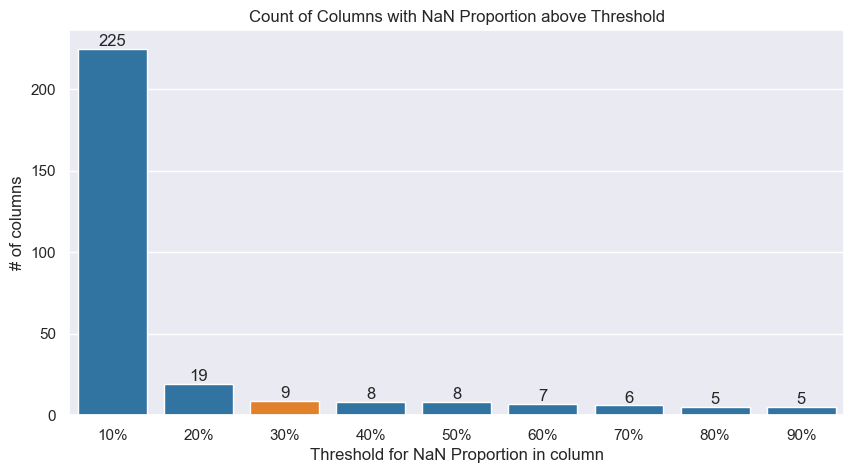

In [75]:
x = [round(x, 3) for x in np.arange(0.1,1,0.1)]

y = [(nan_proportion >= t).sum() for t in x]

colors = ['tab:blue' if val != 0.3 else 'tab:orange' for val in x]

g = sns.barplot(x = x,
                y = y,
                palette = colors)

g.set_xticklabels(["{:.0%}".format(x) for x in x])

g.bar_label(g.containers[0])

g.set_xlabel('Threshold for NaN Proportion in column')

g.set_ylabel('# of columns')

g.set_title('Count of Columns with NaN Proportion above Threshold')

plt.show()

In [76]:
for t in np.arange(0.1, 1, 0.1):

    print(f'Amount of columns with more than {t:.0%} of NaNs')

    print((nan_proportion >= t).sum(), end = '\n\n')

Amount of columns with more than 10% of NaNs
225

Amount of columns with more than 20% of NaNs
19

Amount of columns with more than 30% of NaNs
9

Amount of columns with more than 40% of NaNs
8

Amount of columns with more than 50% of NaNs
8

Amount of columns with more than 60% of NaNs
7

Amount of columns with more than 70% of NaNs
6

Amount of columns with more than 80% of NaNs
5

Amount of columns with more than 90% of NaNs
5



In [77]:
nan_proportion[nan_proportion >= 0.3]

ALTER_KIND4         0.998648
TITEL_KZ            0.997576
ALTER_KIND3         0.993077
ALTER_KIND2         0.966900
ALTER_KIND1         0.909048
AGER_TYP            0.760196
D19_KK_KUNDENTYP    0.655967
KBA05_BAUMAX        0.534687
ALTER_HH            0.348137
dtype: float64

Using 30% as threshold for eliminating because having too many empty values on a column might skew its distribution after imputation

In [78]:
census.drop(columns = nan_proportion[nan_proportion >= 0.3].index, inplace=True)

# Exploring distributions in remaining features

Variables might have behaviours that will require handling (e.g. re-encoding).

In [79]:
col_classification.head()

,Information level,Attribute
0,Person,AGER_TYP
1,Person,ALTERSKATEGORIE_GROB
2,Person,ANREDE_KZ
3,Person,CJT_GESAMTTYP
4,Person,FINANZ_MINIMALIST


In [80]:
census_var_types = pd.read_excel('data/raw/DIAS Attributes - Values 2017.xlsx',
                                 sheet_name = 'Tabelle1_fixed',
                                 header = 1,
                                 usecols = 'B:C')\
                        .dropna(how = 'all')

In [81]:
census_var_types.shape

(339, 2)

In [82]:
# Assert all columns in the data have a type associated
assert (len(np.setdiff1d(census.columns, census_var_types['Attribute'])) - 1) == 0

In [83]:
census_var_types.isna().sum()

Attribute    0
Type         0
dtype: int64

In [84]:
# Count of variables by type
census_var_types[census_var_types['Attribute'].isin(census.columns)]['Type'].value_counts()

interval    295
nominal      15
numeric       9
binary        6
Name: Type, dtype: int64

In [85]:
num_vars = np.intersect1d(census.columns, census_var_types[census_var_types['Type'] == 'numeric']['Attribute'].values)

In [86]:
num_vars

array(['ANZ_HAUSHALTE_AKTIV', 'ANZ_HH_TITEL', 'ANZ_KINDER',
       'ANZ_PERSONEN', 'ANZ_STATISTISCHE_HAUSHALTE', 'ANZ_TITEL',
       'GEBURTSJAHR', 'KBA13_ANZAHL_PKW', 'MIN_GEBAEUDEJAHR'],
      dtype=object)

## Numeric columns

In [87]:
census[num_vars].describe()

,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,GEBURTSJAHR,KBA13_ANZAHL_PKW,MIN_GEBAEUDEJAHR
count,798073.000000,794213.000000,817722.000000,817722.000000,798073.000000,817722.000000,891221.000000,785421.000000,798073.000000
mean,8.287263,0.040647,0.154018,1.727637,7.599356,0.004162,1101.178533,619.701439,1993.277011
std,15.628087,0.324028,0.502389,1.155849,14.332201,0.068855,976.583551,340.034318,3.332739
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1985.000000
25%,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,384.000000,1992.000000
50%,4.000000,0.000000,0.000000,1.000000,3.000000,0.000000,1943.000000,549.000000,1992.000000
75%,9.000000,0.000000,0.000000,2.000000,9.000000,0.000000,1970.000000,778.000000,1993.000000
max,595.000000,23.000000,11.000000,45.000000,449.000000,6.000000,2017.000000,2300.000000,2016.000000


In [88]:
np.setdiff1d(num_vars, ['ANZ_HH_TITEL','ANZ_KINDER','GEBURTSJAHR'])

array(['ANZ_HAUSHALTE_AKTIV', 'ANZ_PERSONEN',
       'ANZ_STATISTISCHE_HAUSHALTE', 'ANZ_TITEL', 'KBA13_ANZAHL_PKW',
       'MIN_GEBAEUDEJAHR'], dtype=object)

In [89]:
display(census[['ANZ_HH_TITEL','ANZ_KINDER','GEBURTSJAHR']].describe())

,ANZ_HH_TITEL,ANZ_KINDER,GEBURTSJAHR
count,794213.000000,817722.000000,891221.000000
mean,0.040647,0.154018,1101.178533
std,0.324028,0.502389,976.583551
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,1943.000000
75%,0.000000,0.000000,1970.000000
max,23.000000,11.000000,2017.000000


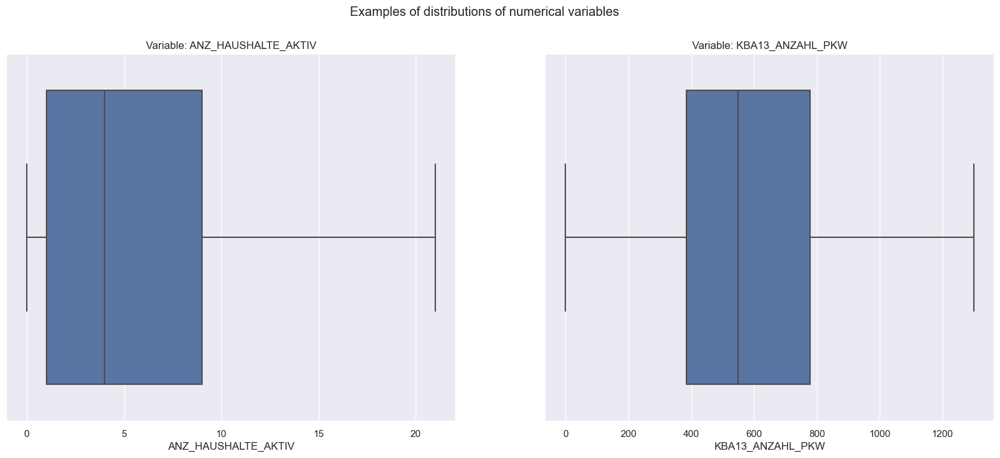

In [107]:
fig, axs = plt.subplots(1,2,figsize = (20,7.5))

sns.boxplot(data = census,
             x = 'ANZ_HAUSHALTE_AKTIV',
             ax = axs[0],
             showfliers = False)

axs[0].set_title('Variable: ANZ_HAUSHALTE_AKTIV')

sns.boxplot(data = census,
             x = 'KBA13_ANZAHL_PKW',
             ax = axs[1],
             showfliers = False)

axs[1].set_title('Variable: KBA13_ANZAHL_PKW')

plt.suptitle('Examples of distributions of numerical variables')

plt.show()

In [91]:
for col in ['ANZ_HH_TITEL','ANZ_KINDER','GEBURTSJAHR']:

    print(f'Proportion of 0 in {col}: {(census[col] == 0).mean():.2%}')

Proportion of 0 in ANZ_HH_TITEL: 86.43%
Proportion of 0 in ANZ_KINDER: 82.05%
Proportion of 0 in GEBURTSJAHR: 44.02%


There are columns that, albeit not having NaNs, have a big amount of zeroes in them. This can be handled by reencoding the features.  
This changes their dtype, but might make them more close to the reality.

Almost half of the column has 0 as YoB

Year of birth seem to have a lot of "0" in its entries, it might not be such an useful column. Considering we have the age category (ALTERSKATEGORIE) at our disposal, it might be more interesting to use this column as a proxy for age

In [87]:
census.drop(columns = 'GEBURTSJAHR', inplace = True)

In [90]:
census['ANZ_KINDER'].value_counts(normalize = True)

0.0     0.894243
1.0     0.067688
2.0     0.029894
3.0     0.006574
4.0     0.001293
5.0     0.000232
6.0     0.000057
7.0     0.000012
9.0     0.000004
11.0    0.000001
8.0     0.000001
Name: ANZ_KINDER, dtype: float64

This column might benefit from being binned

In [91]:
census['ANZ_HH_TITEL'].value_counts()

0.0     770244
1.0      20157
2.0       2459
3.0        585
4.0        232
5.0        117
6.0        106
8.0         68
7.0         65
9.0         34
13.0        29
12.0        22
11.0        22
14.0        16
10.0        16
17.0        13
20.0         9
15.0         7
18.0         6
16.0         3
23.0         3
Name: ANZ_HH_TITEL, dtype: int64

This column might benefit from being binarized

In [92]:
census['ANZ_HH_TITEL'] = np.where(census['ANZ_HH_TITEL'] == 0, 0, 1)

census['ANZ_KINDER'] = np.where(census['ANZ_KINDER'] == 0, 0, 1)

In [93]:
census['ANZ_HH_TITEL'].value_counts()

0    770244
1    120977
Name: ANZ_HH_TITEL, dtype: int64

In [153]:
census_var_types.loc[census_var_types['Attribute'] == 'ANZ_HH_TITEL', 'Type'] = 'binary'

census_var_types.loc[census_var_types['Attribute'] == 'ANZ_KINDER', 'Type'] = 'binary'

## Segregating D19 into grid and household columns

In [95]:
d19_grid_cols = []

d19_household_cols = []

for col in census.columns:

    if col.startswith('D19'):

        if ('DATUM' in col) or ('ANZ' in col) or ('QUOTE' in col):

            d19_household_cols.append(col)
        
        else:

            d19_grid_cols.append(col)

## 125 Grid

In [108]:
grid_cols_list = fetch_info_level_columns(att_info_updated,census,'125m x 125m Grid')

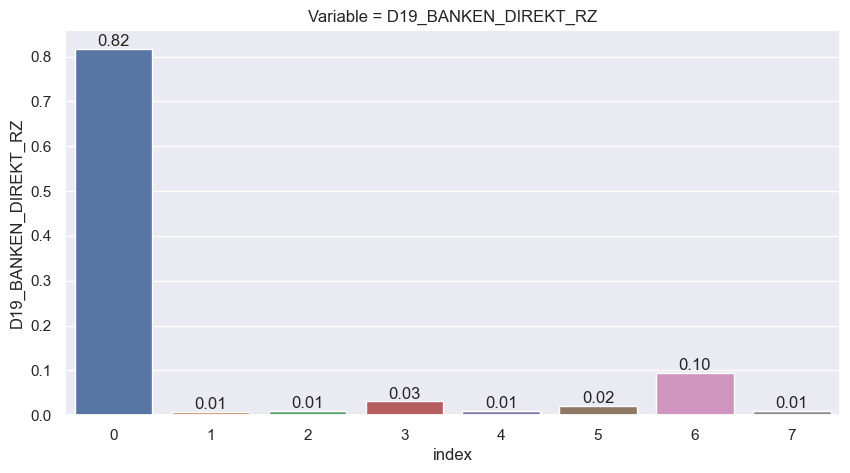

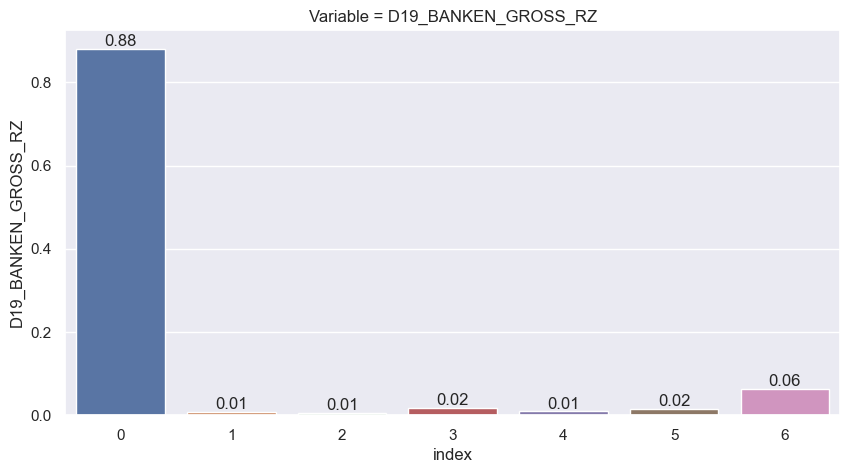

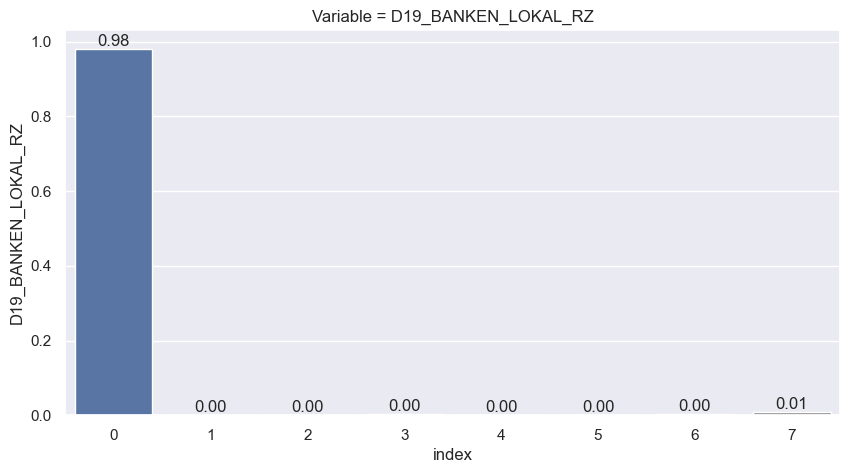

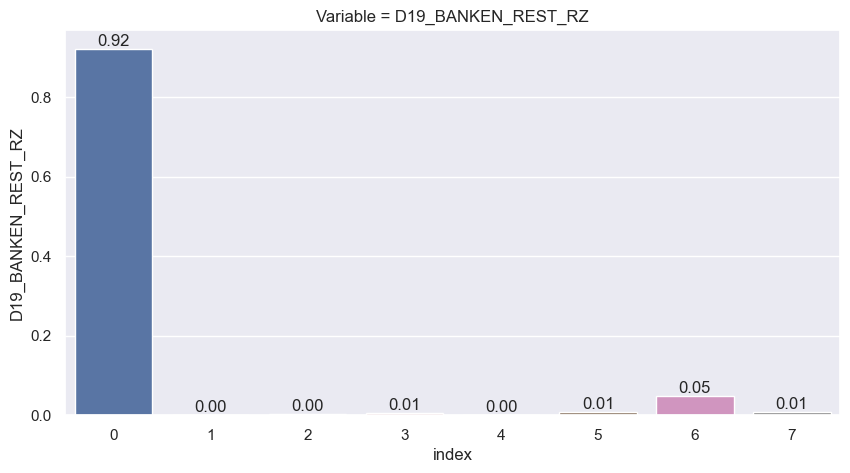

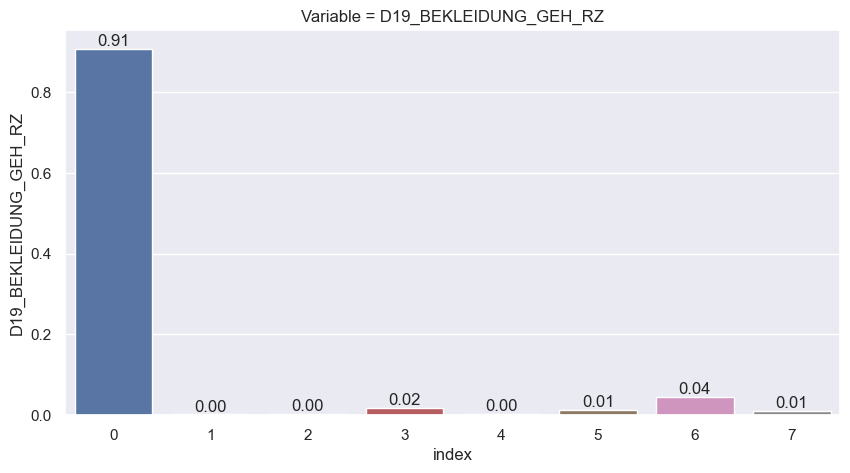

...

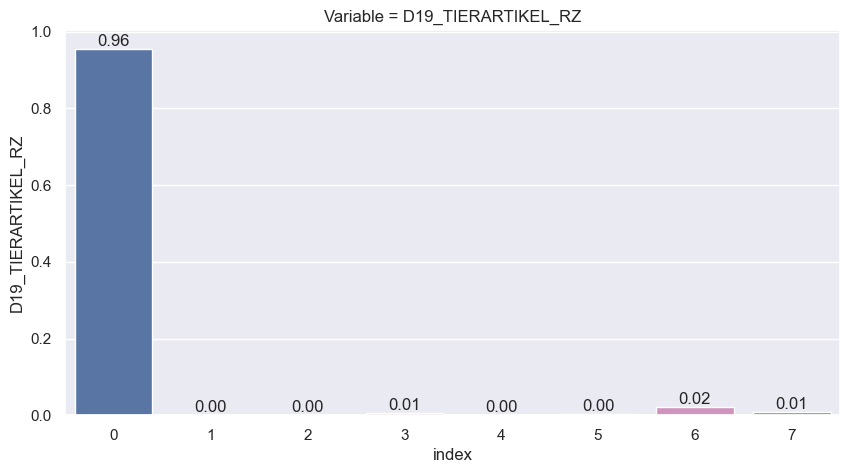

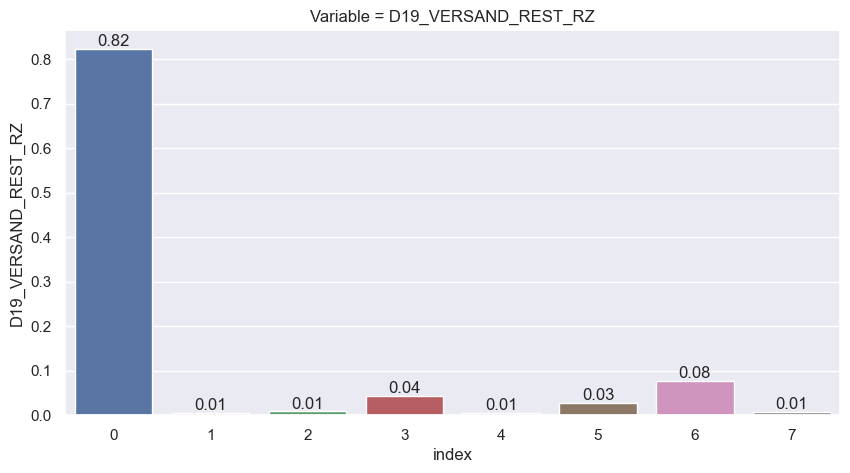

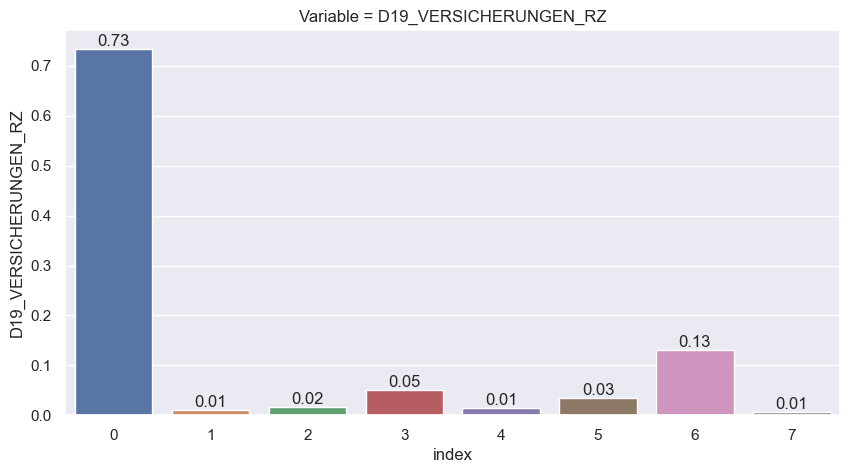

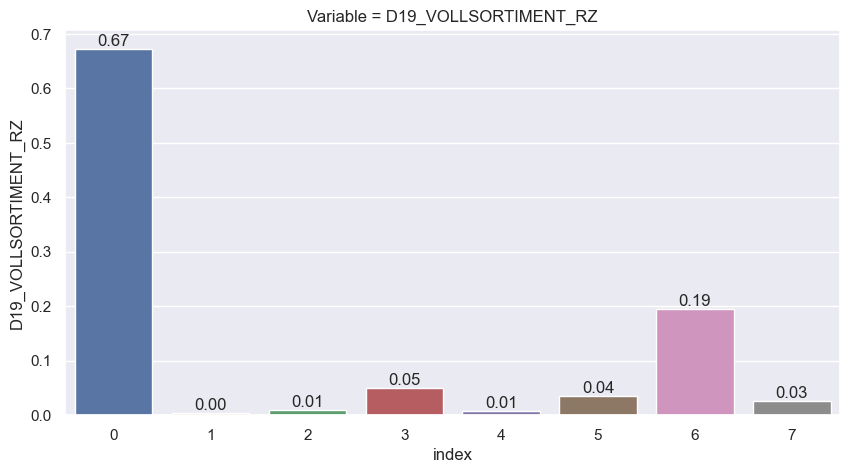

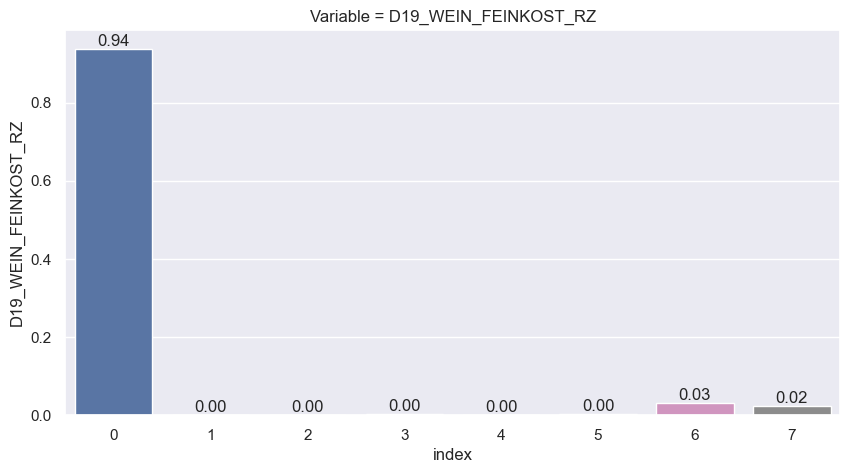

In [97]:
count_val_in_cols(census, grid_cols_list,plot_count=True,normalize = True)

There are some variables dominated by zeroes. This might not be necessairly helpful to aid cluster formation, but may help in identifying customers that actually are potential buyers, since they too are sparse in the database when considering the general population.  
 
Therefore these variables will be kept but should probably be re-encoded to help in information separation (reduce category sparsity)

## Buildings

In [98]:
buildings_col_list = fetch_info_level_columns(att_info_updated, census, 'Building')

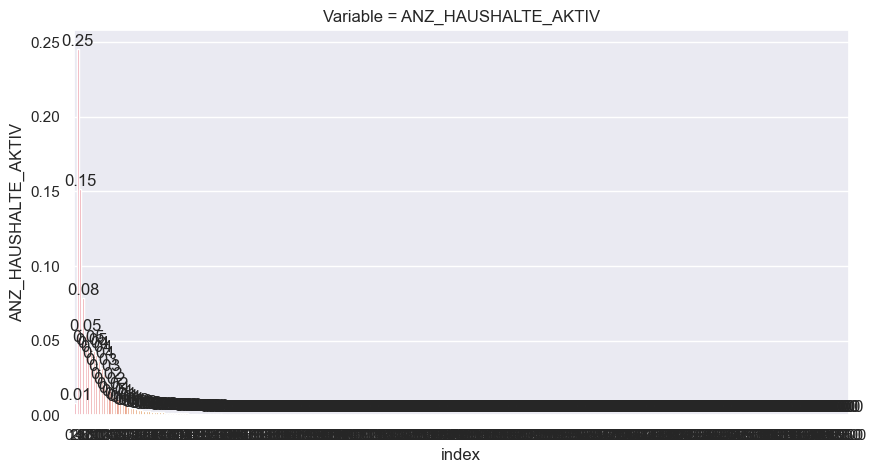

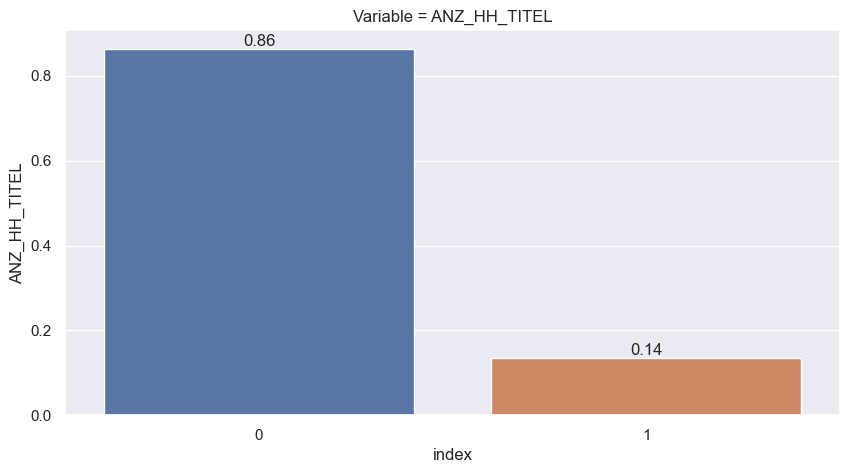

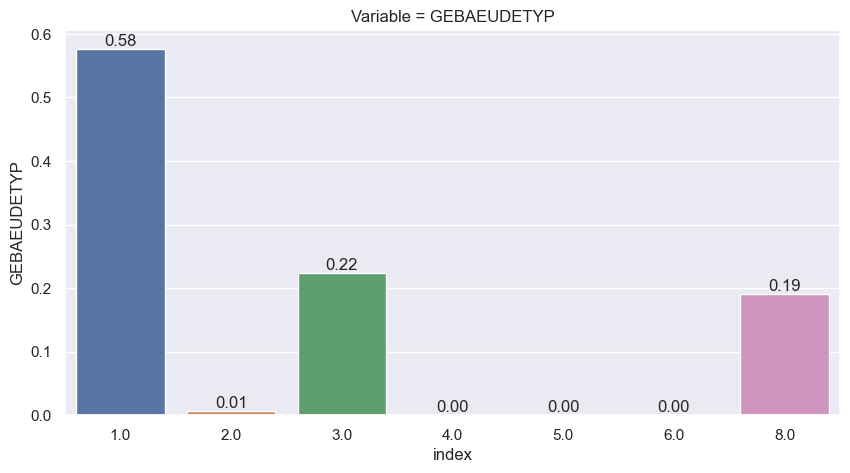

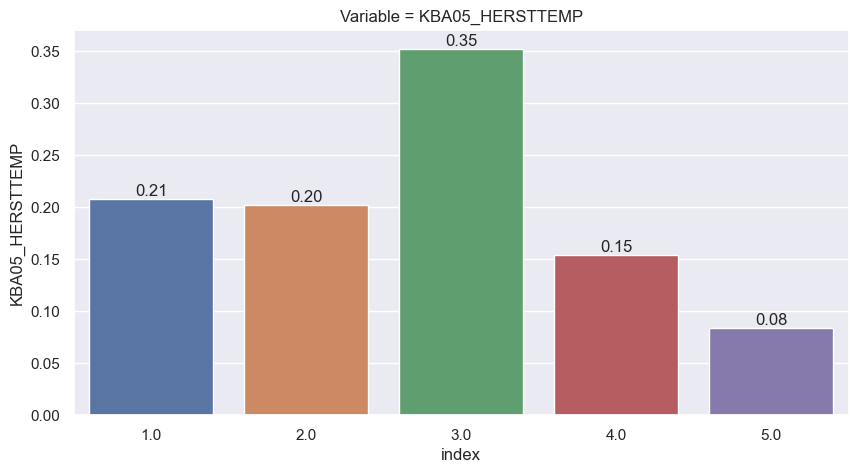

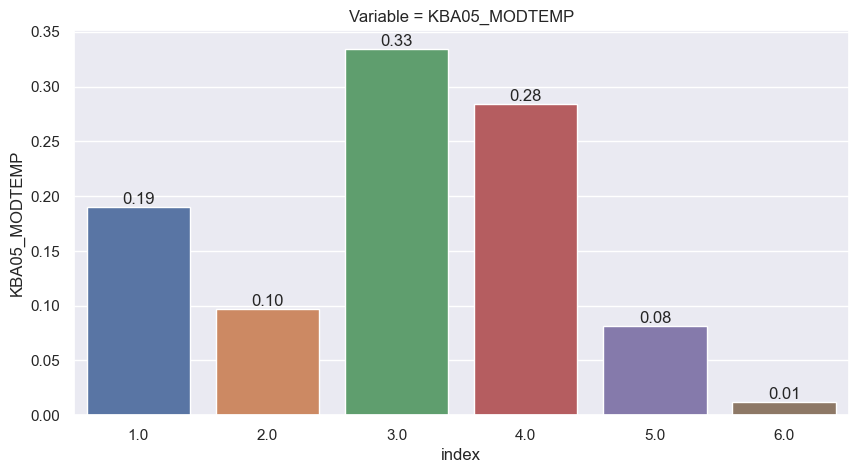

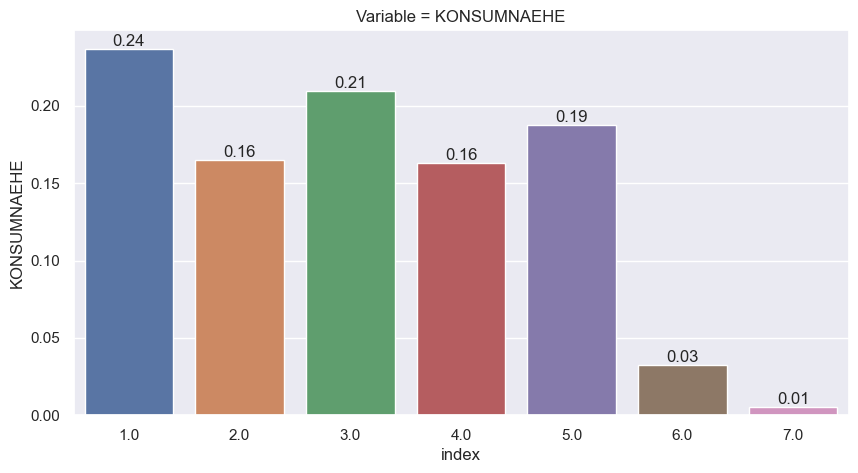

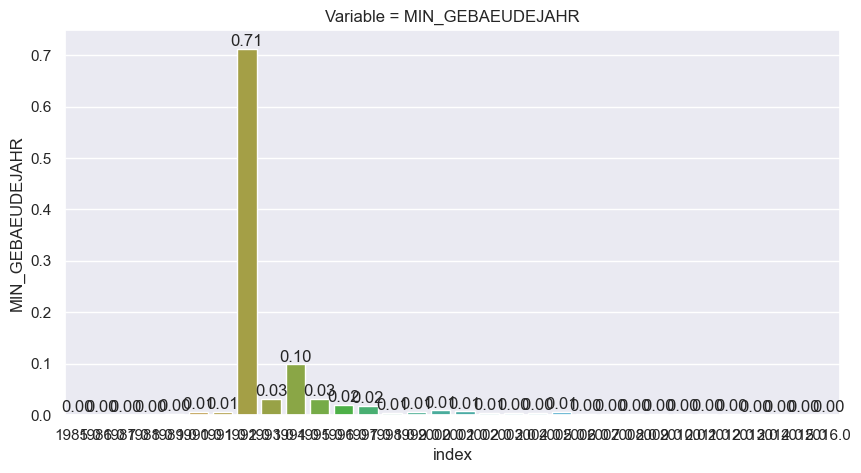

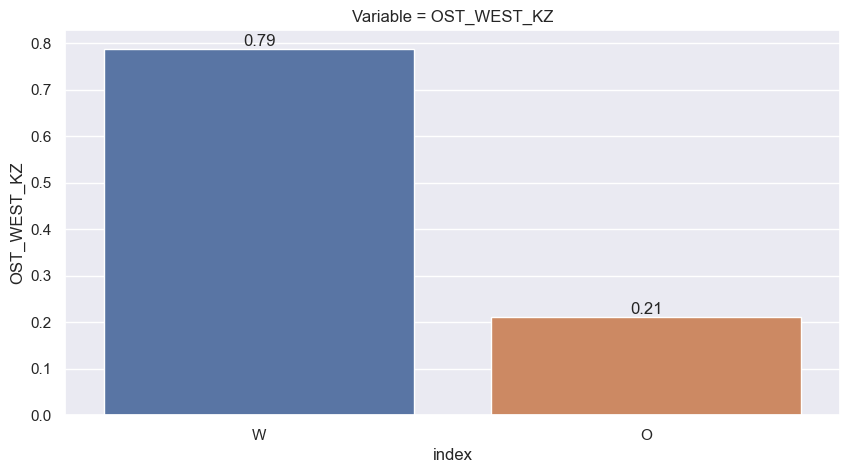

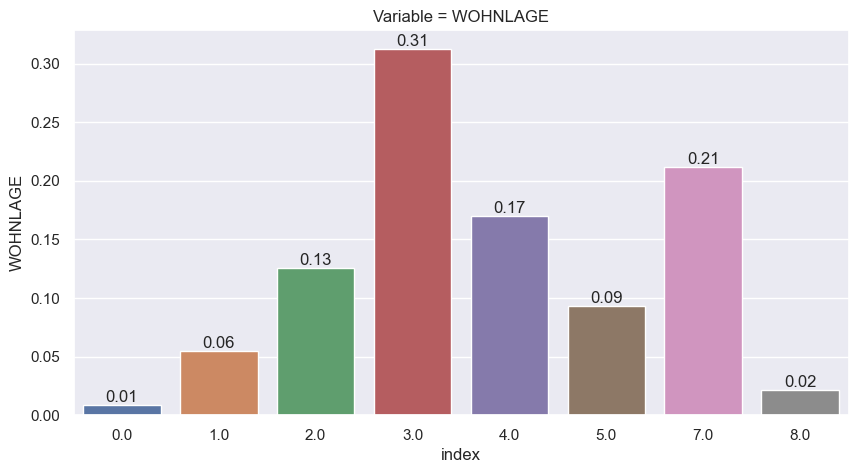

In [99]:
count_val_in_cols(census, buildings_col_list, plot_count = True, normalize = True)

## RR3

In [100]:
rr3_col_list = fetch_info_level_columns(att_info_updated, census, 'Microcell (RR3_ID)')

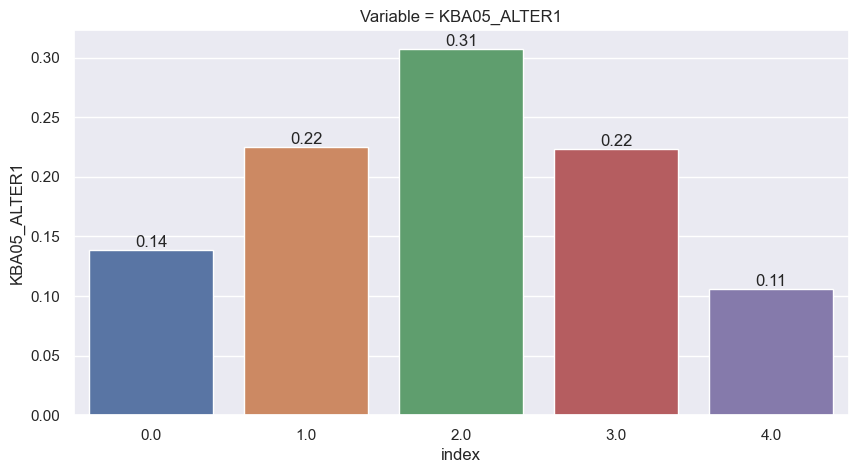

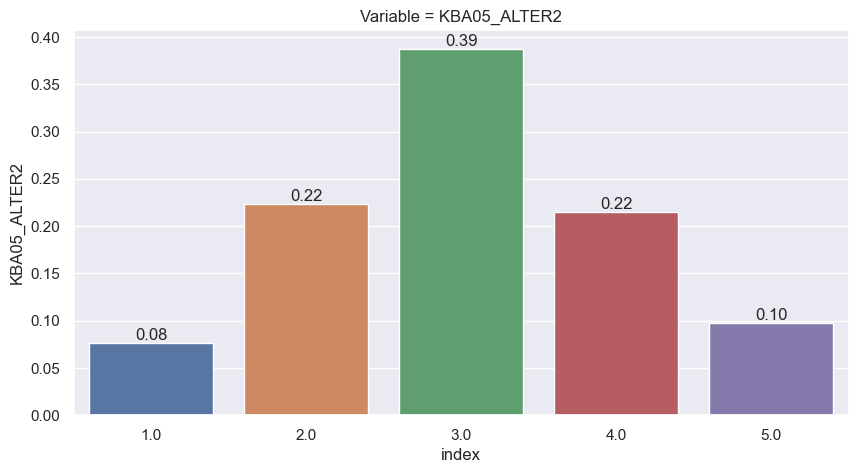

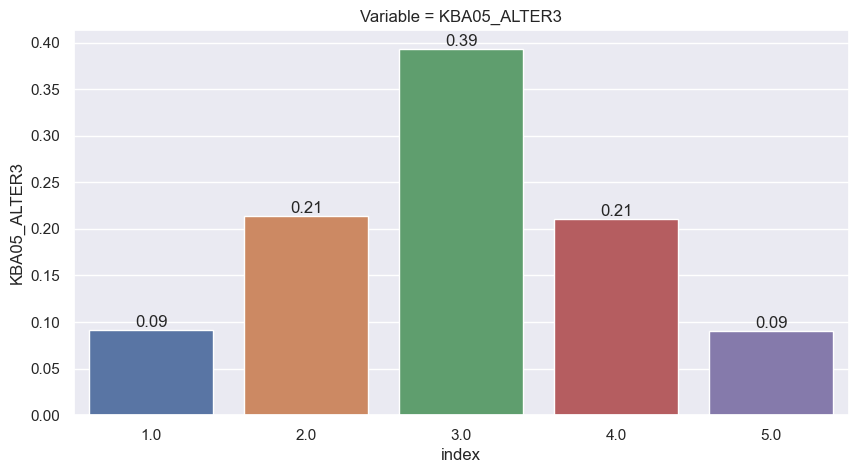

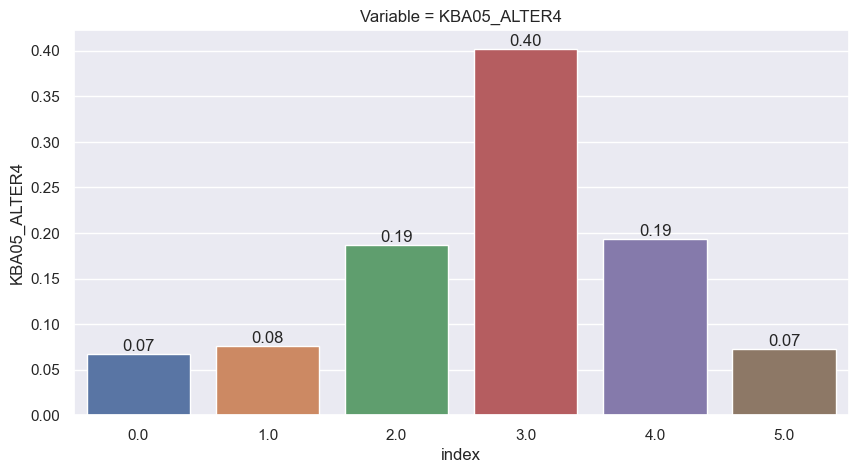

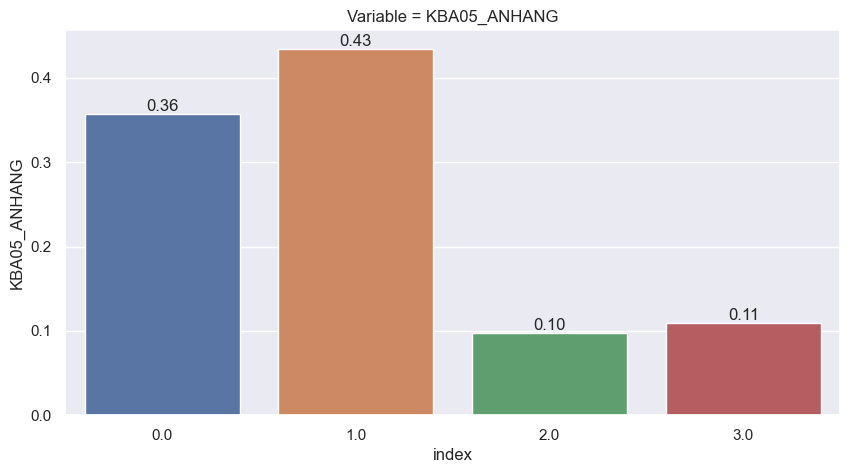

...

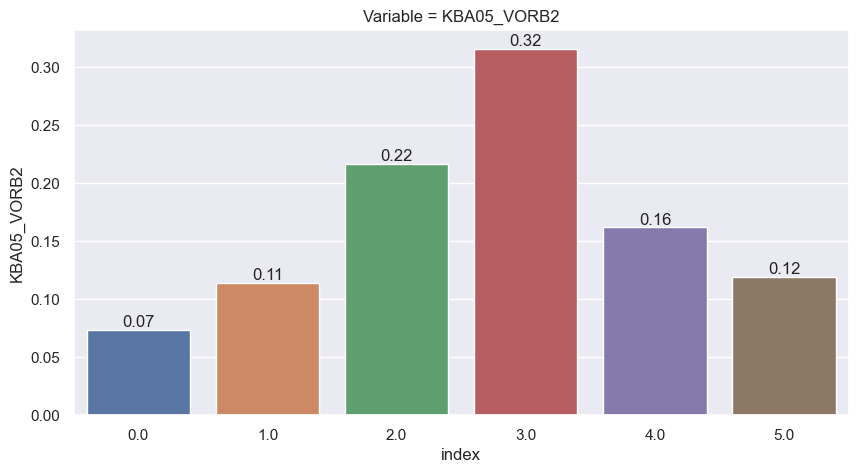

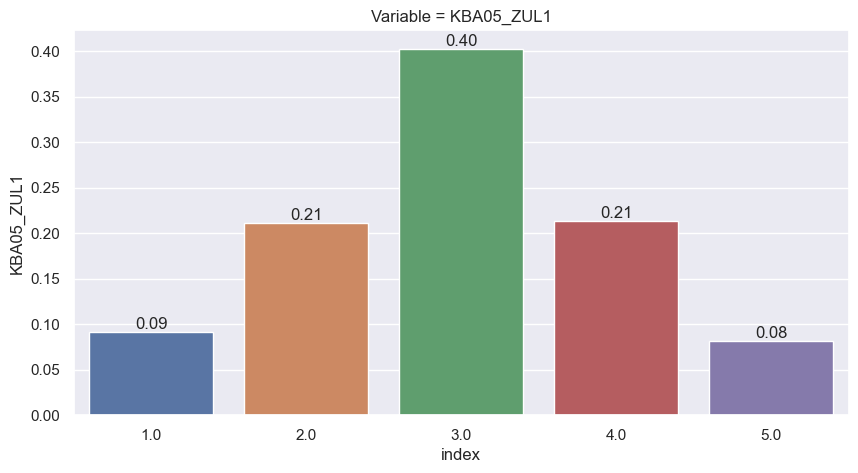

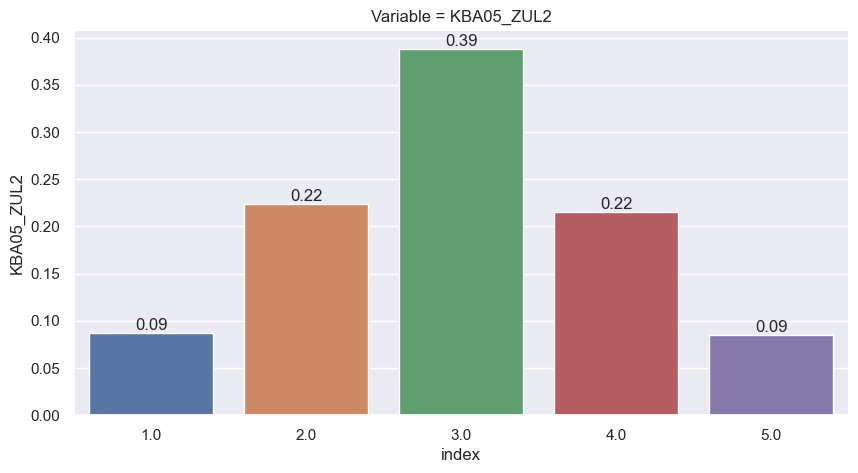

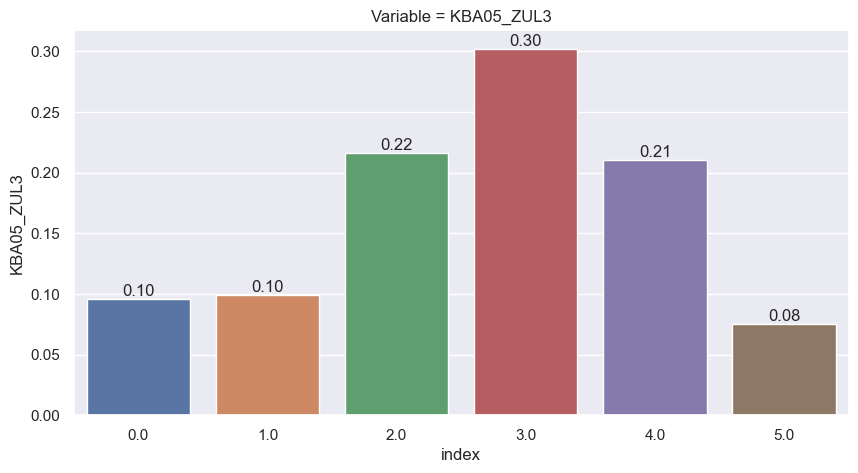

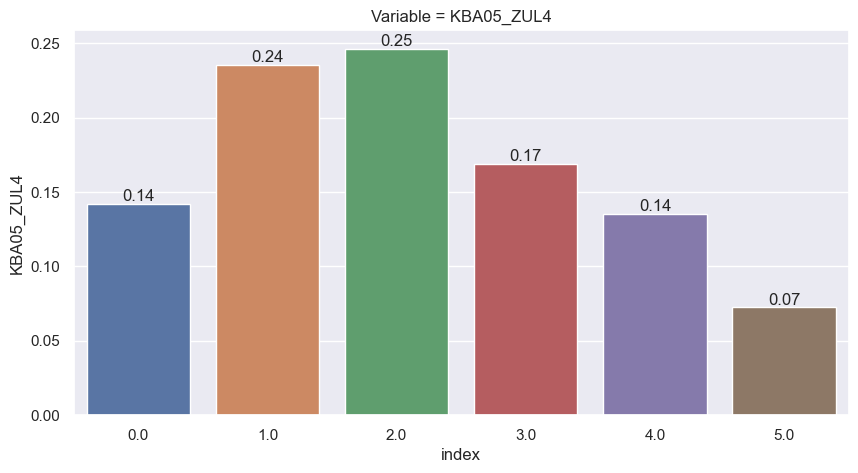

In [101]:
count_val_in_cols(census, rr3_col_list, plot_count = True, normalize = True)

No changes will be made to these variables, they seem reasonably distributed across categories

## Community

In [102]:
community_col_list = fetch_info_level_columns(att_info_updated, census, 'Community')

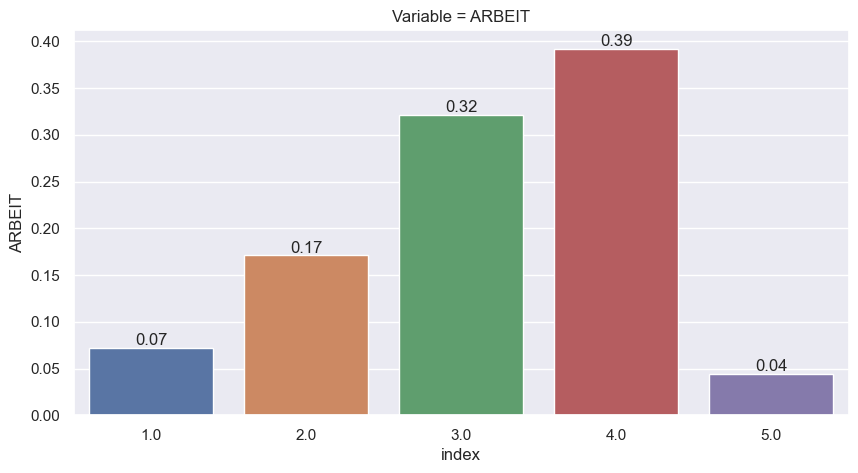

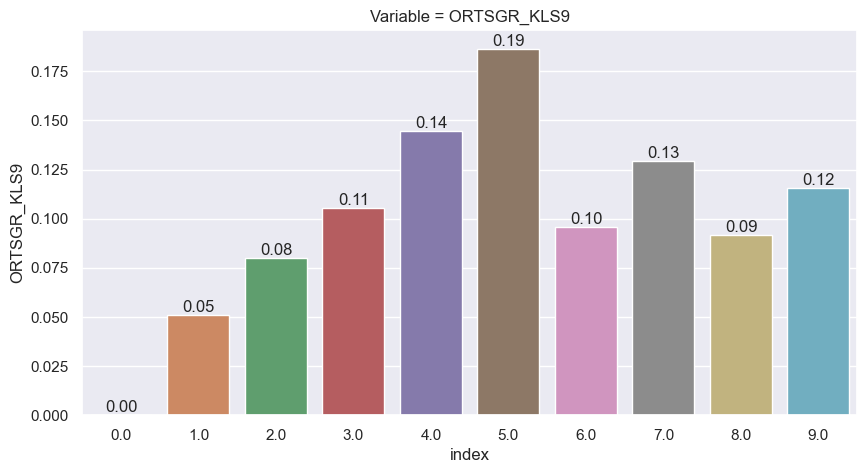

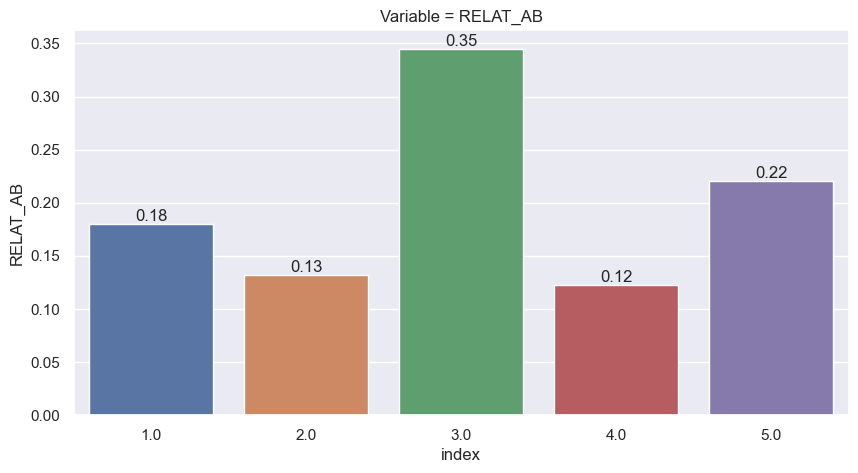

In [103]:
count_val_in_cols(census, community_col_list, plot_count = True, normalize = True)

## Household

In [104]:
household_cols_list = fetch_info_level_columns(att_info_updated, census, 'Household')

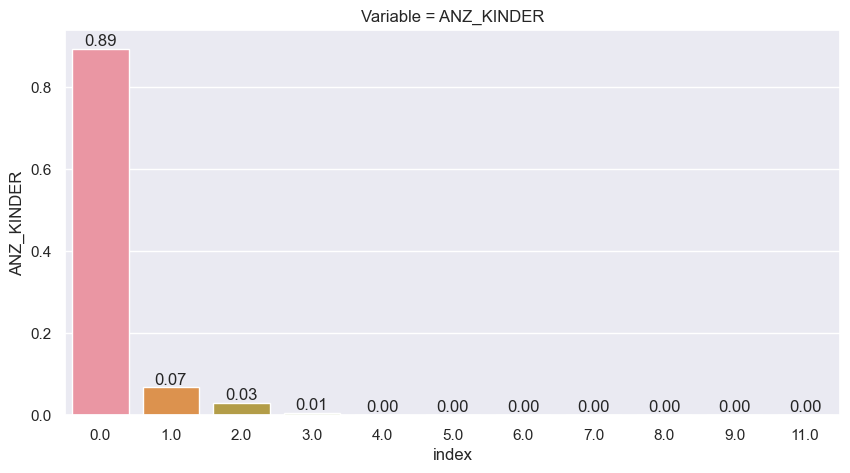

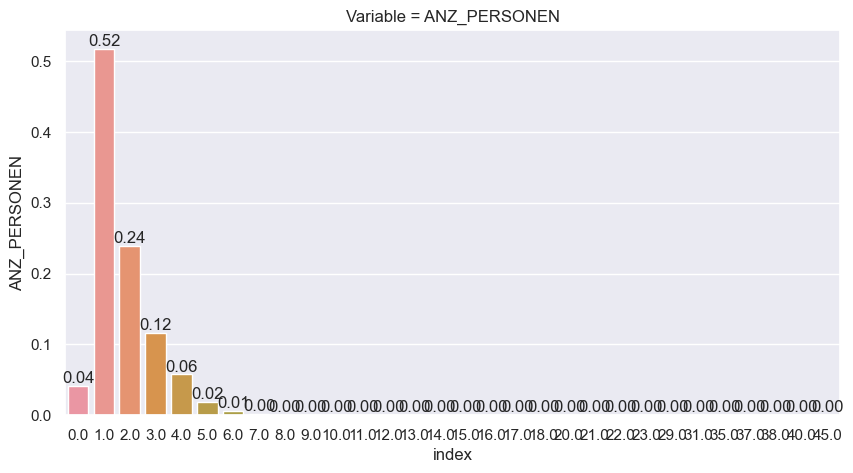

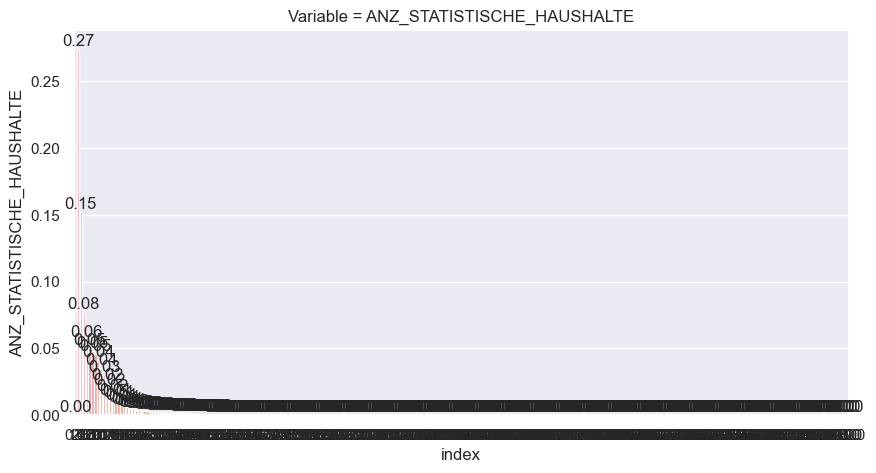

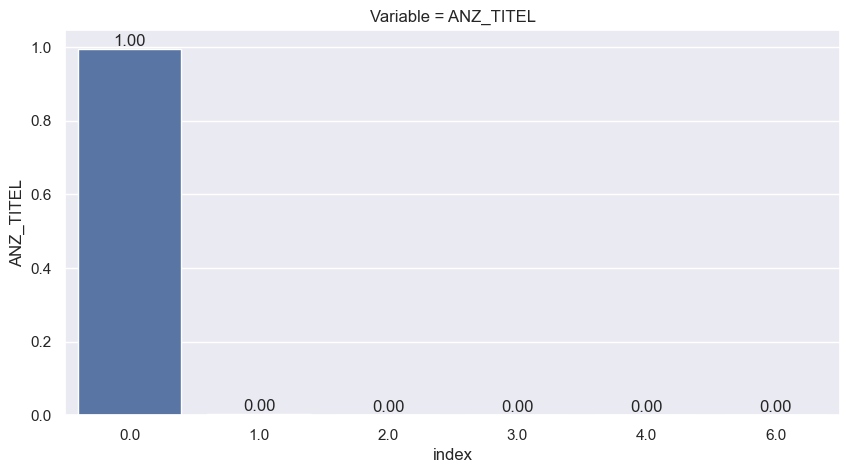

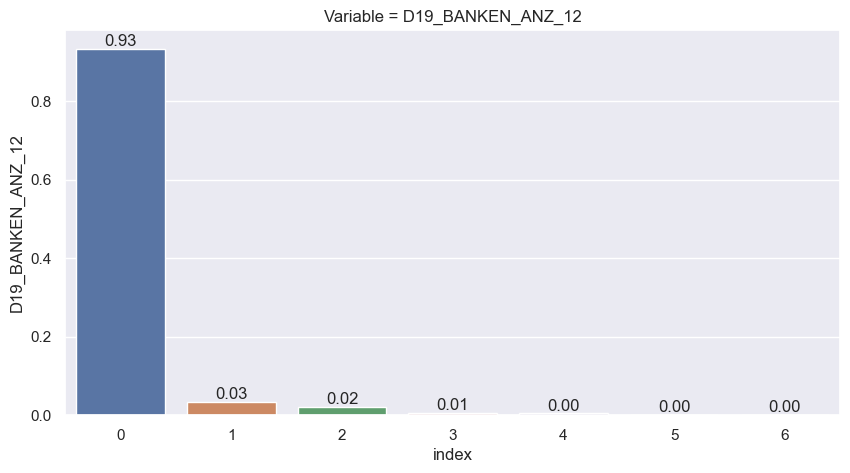

...

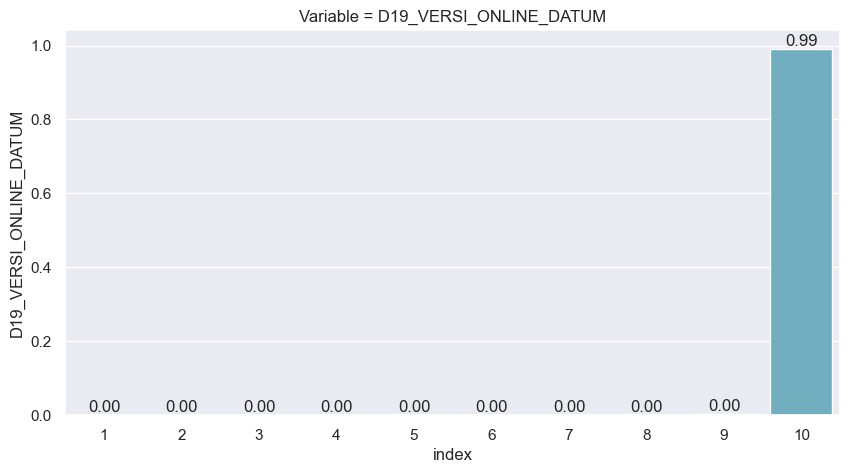

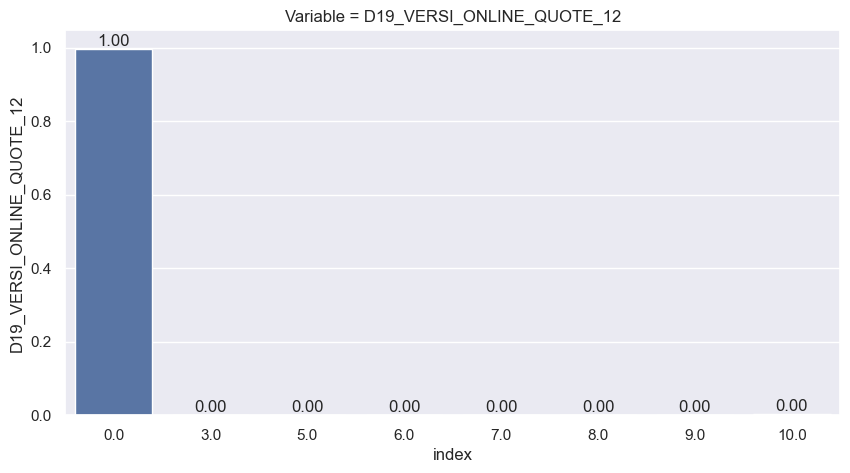

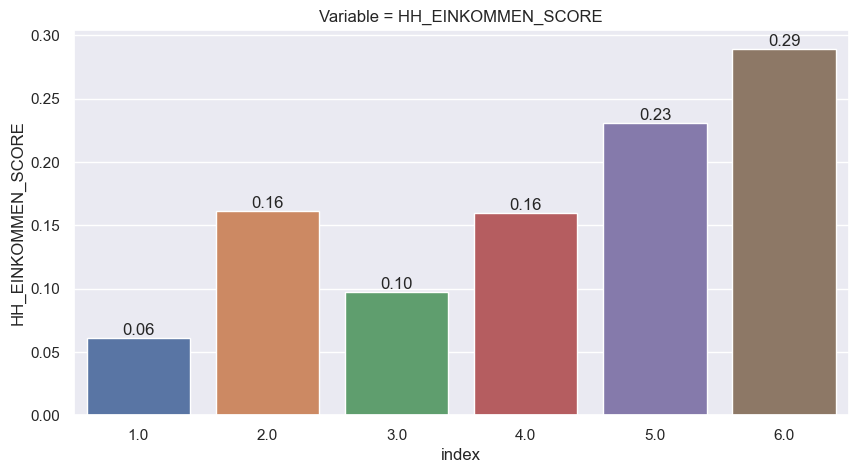

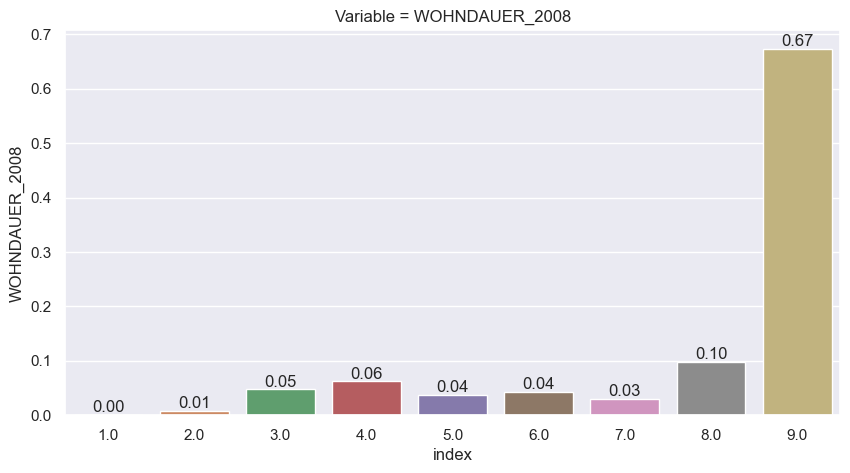

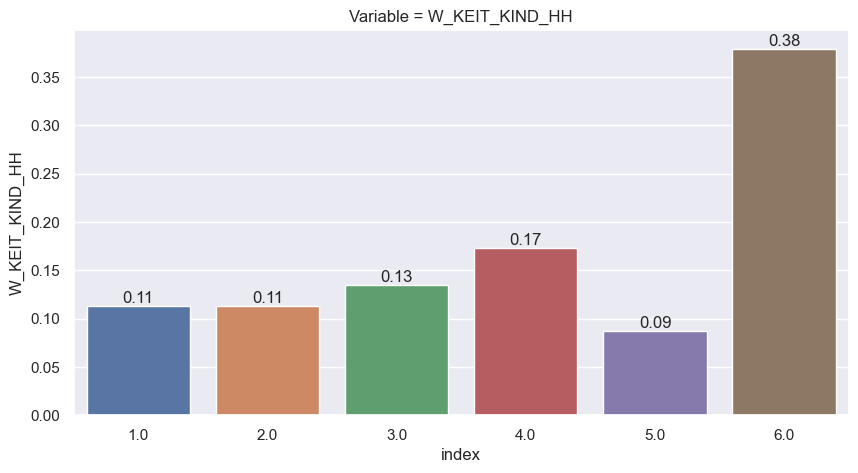

In [105]:
count_val_in_cols(census, household_cols_list, plot_count = True, normalize = True)

The D19 columns might benefit from some grouping of their informations, since the main behaviors are often concentrated in some categories

## RR4

In [106]:
rr4_col_list = fetch_info_level_columns(att_info_updated, census, 'Microcell (RR4_ID)')

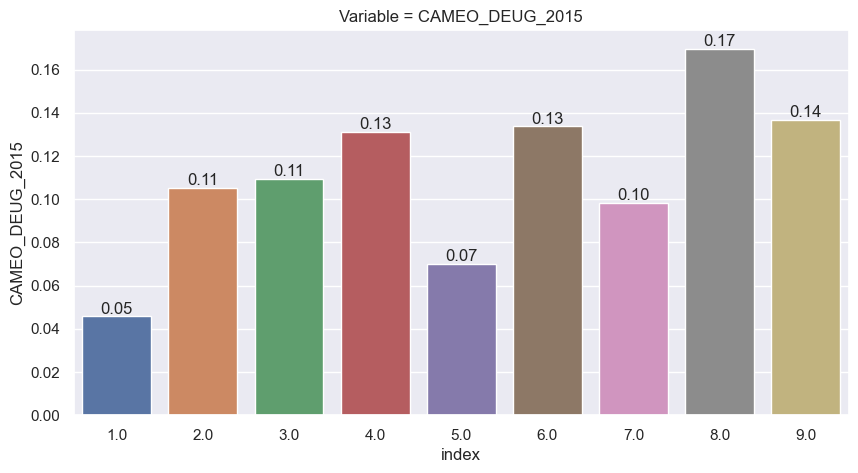

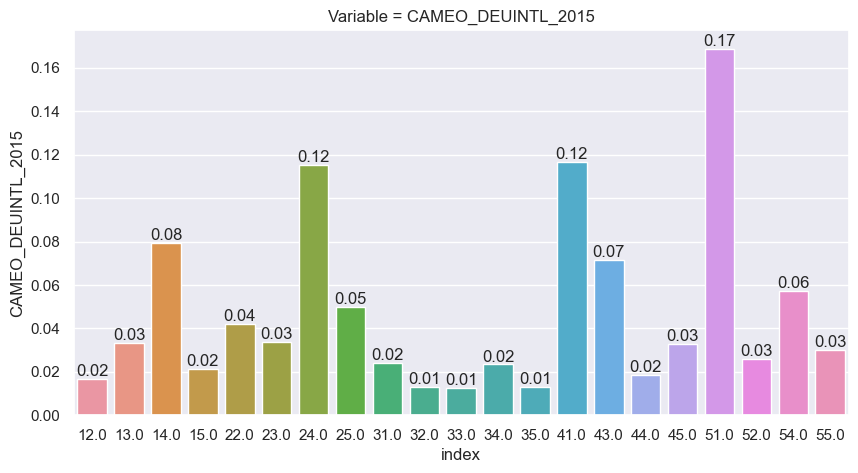

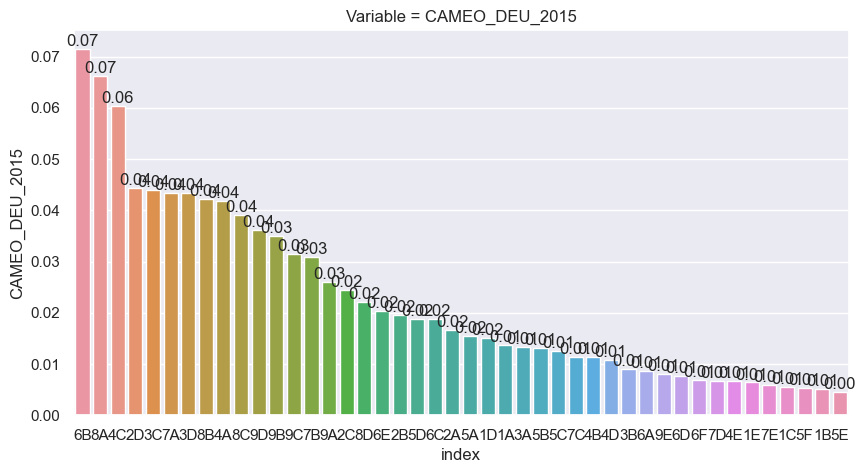

In [107]:
count_val_in_cols(census, rr4_col_list, plot_count = True, normalize = True)

## Person

In [108]:
person_col_list = fetch_info_level_columns(att_info_updated, census, 'Person')

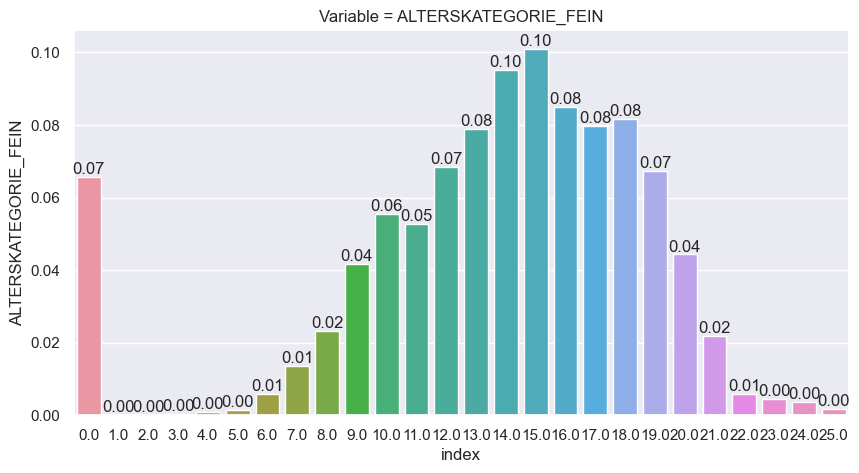

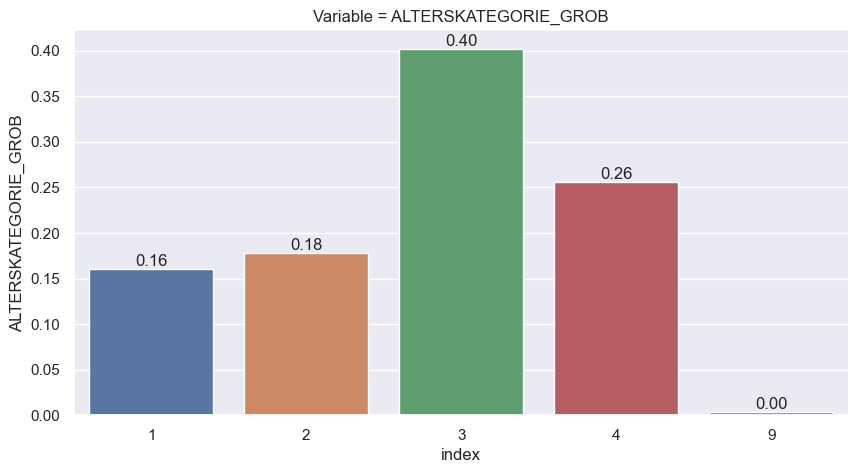

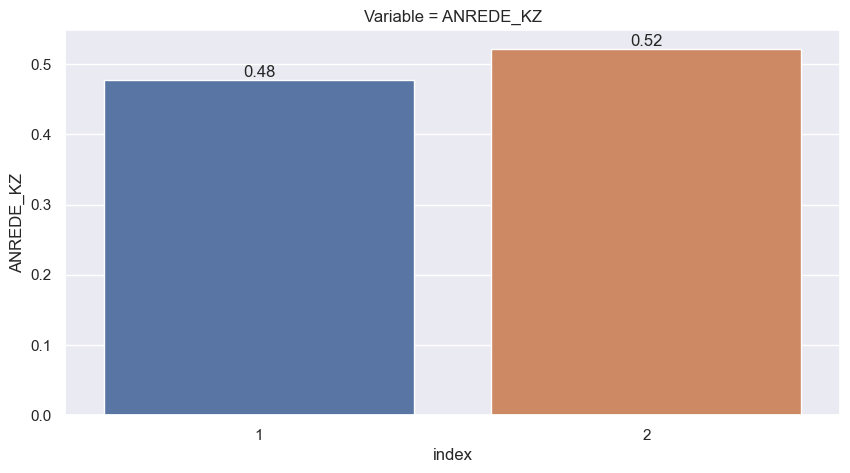

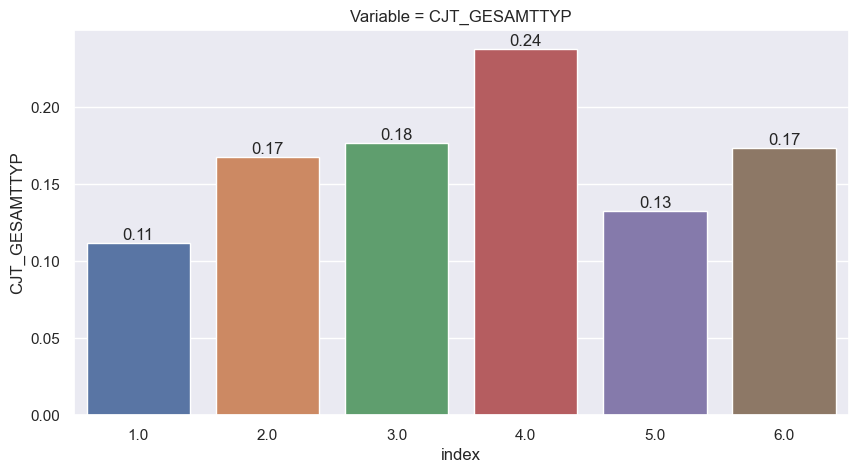

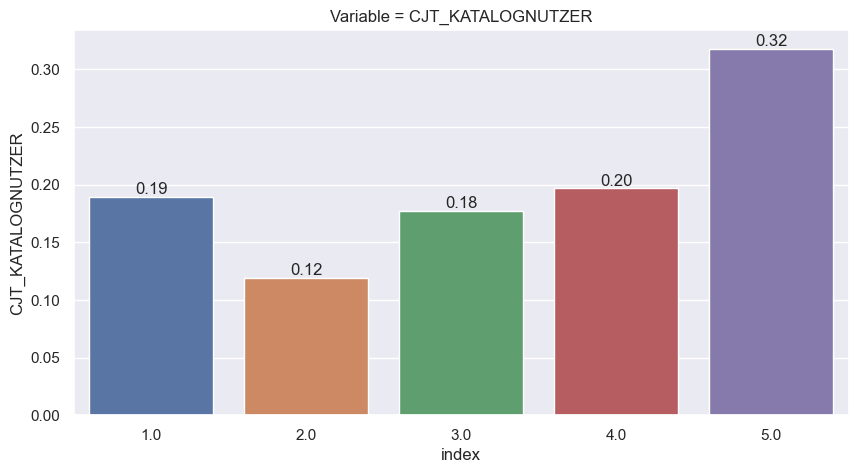

...

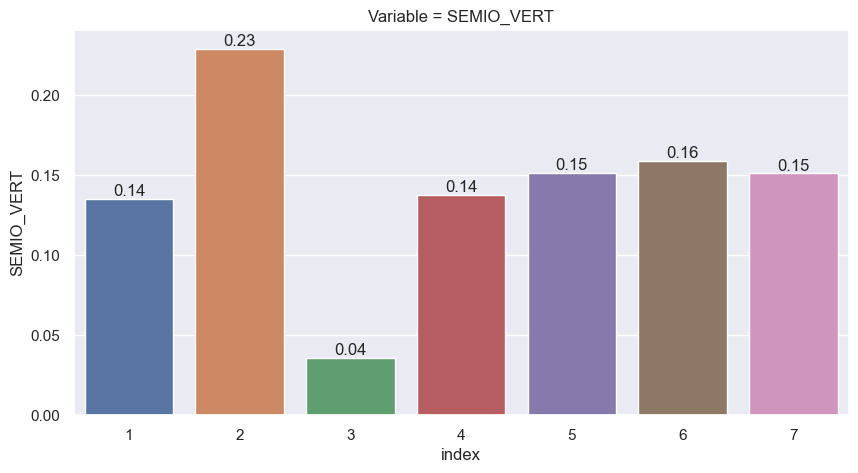

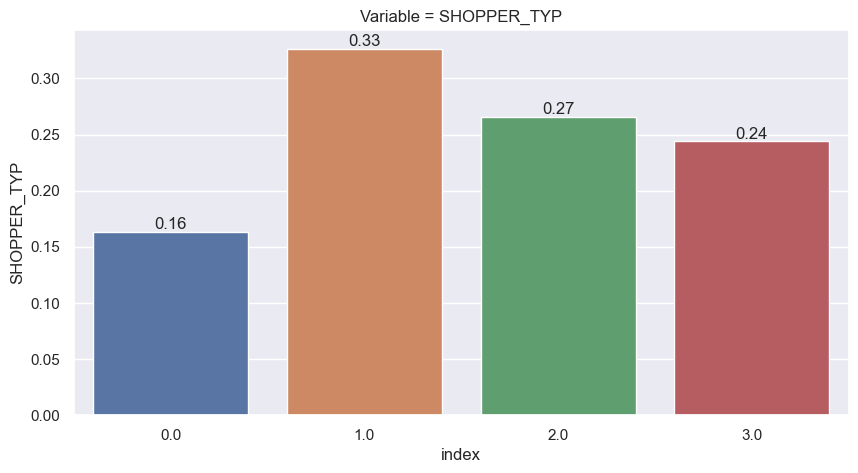

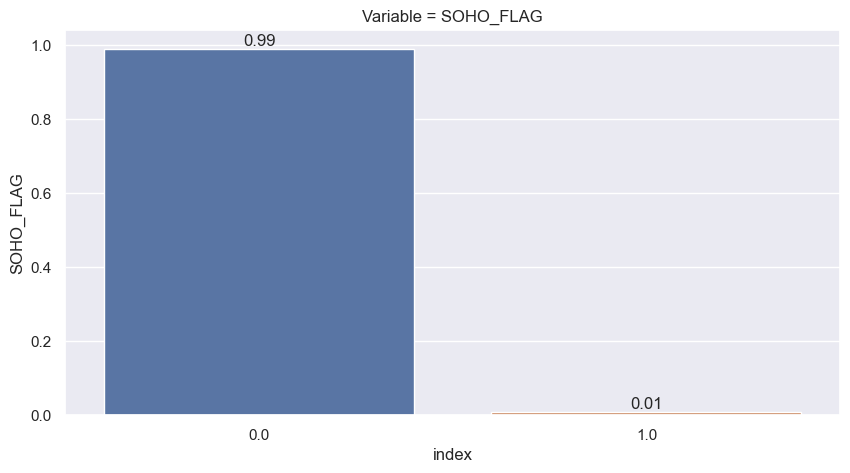

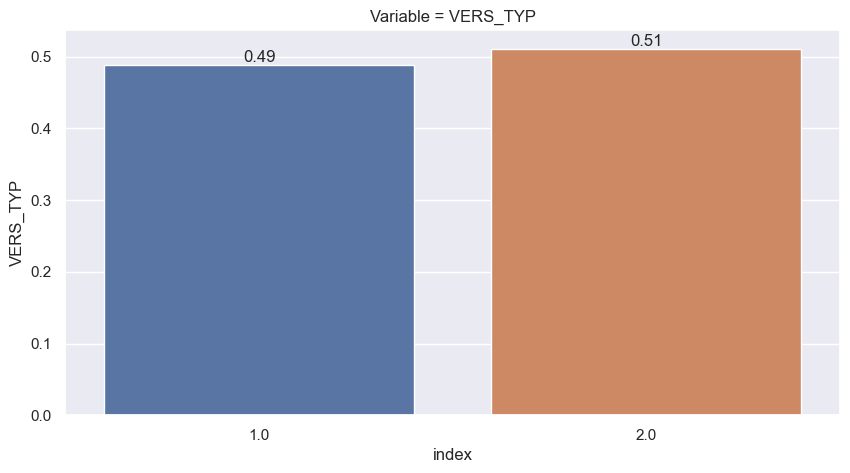

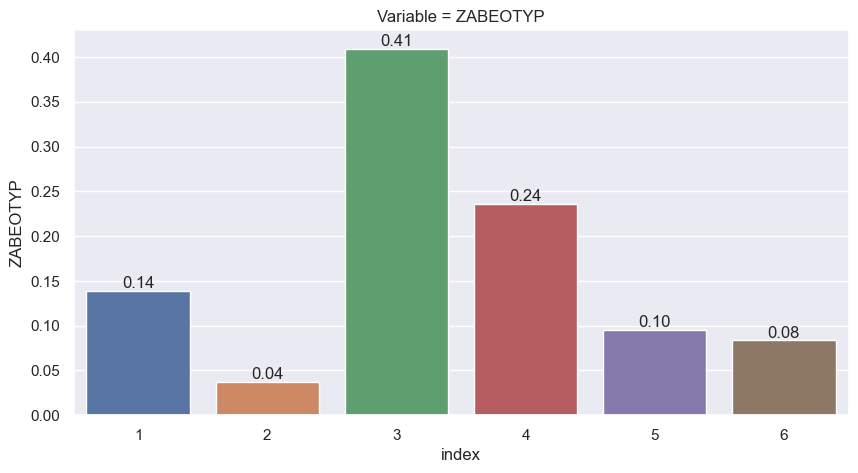

In [109]:
count_val_in_cols(census, person_col_list, plot_count = True, normalize = True)

Maybe Soho should be dropped. It is pretty much dominated by zeroes and does not convey any necessairly important information from a business perspective to the problem.  
"Fein" variables may convey similar information to their "Grob" (more aggregated) counterparts. They might be dropped given redundancy of information.

## PLZ8

In [110]:
att_info_updated['Information level'].unique()

array(['Person', 'Household', 'Building', 'Microcell (RR4_ID)',
       'Microcell (RR3_ID)', '125m x 125m Grid', 'Postcode', 'RR1_ID',
       'PLZ8', 'Community'], dtype=object)

In [111]:
plz8_col_list = fetch_info_level_columns(att_info_updated, census, 'PLZ8')

### PLZ8 cols

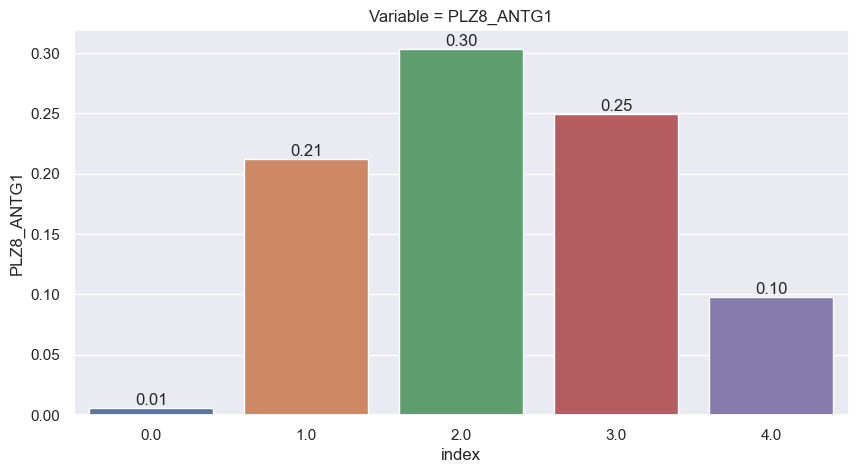

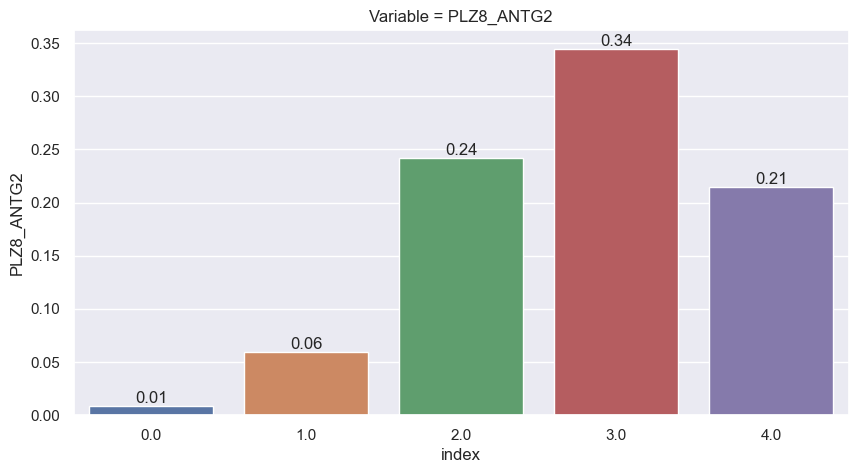

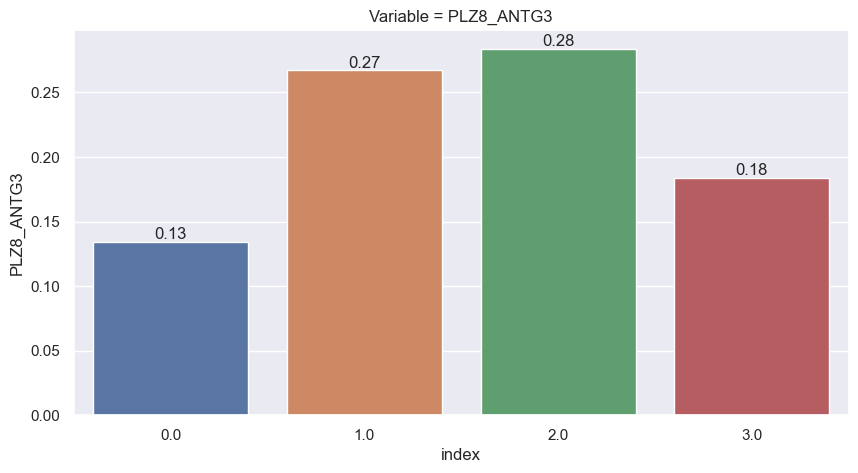

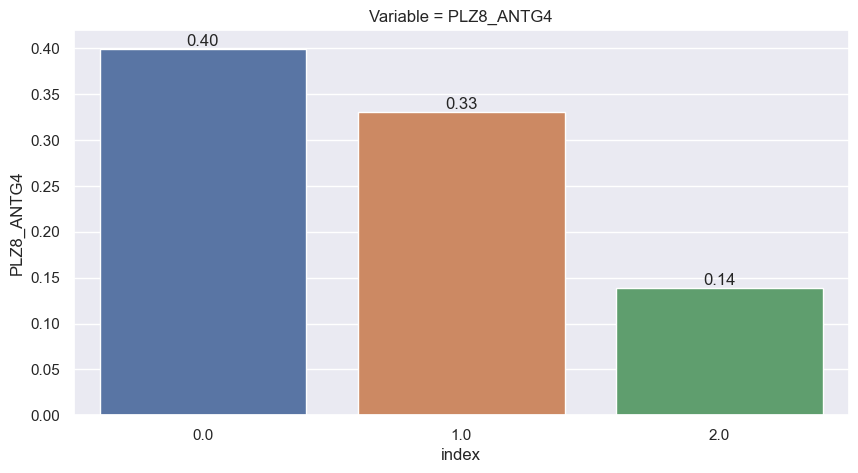

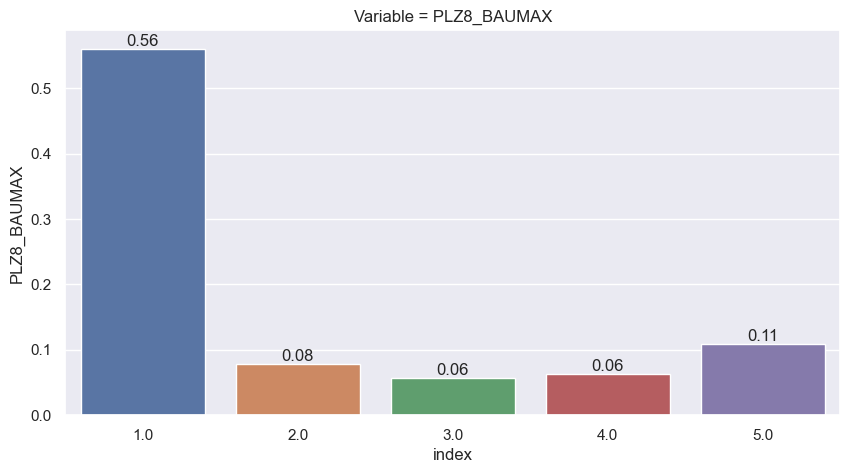

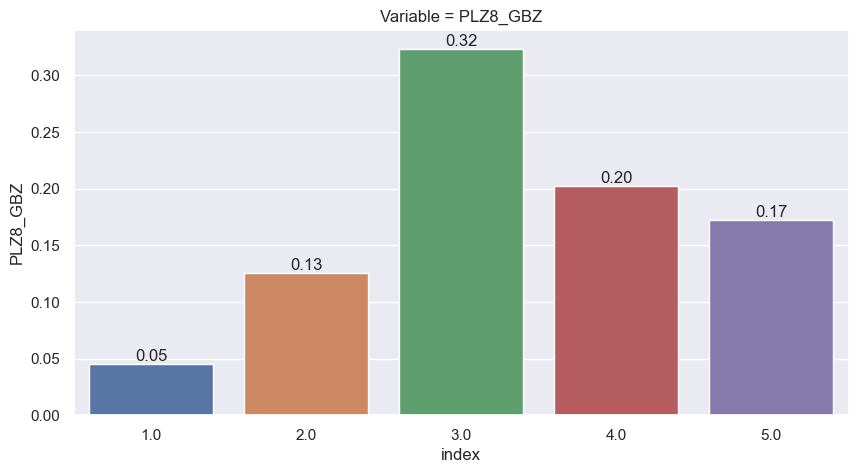

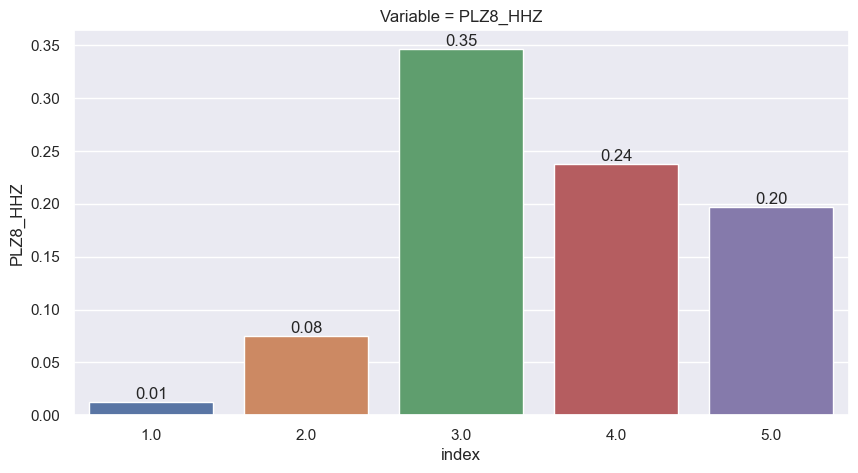

In [112]:
count_val_in_cols(census, sorted([col for col in plz8_col_list if col.startswith('PLZ')]), plot_count = True, normalize = True, dropna = False)

### KBA13

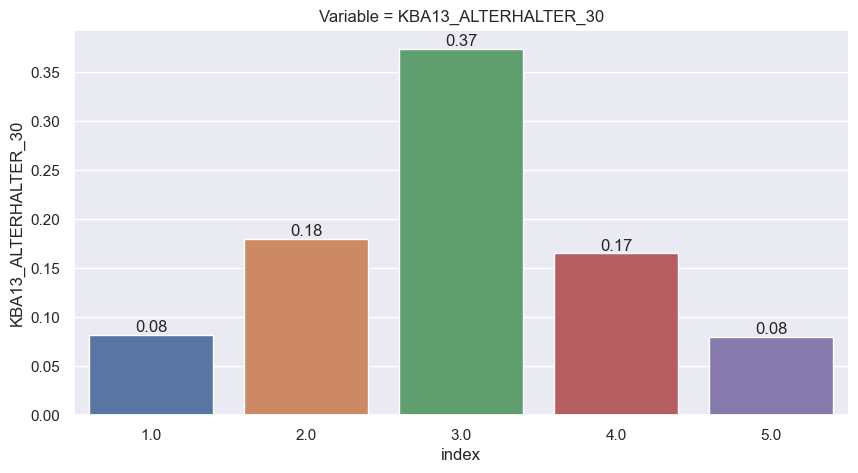

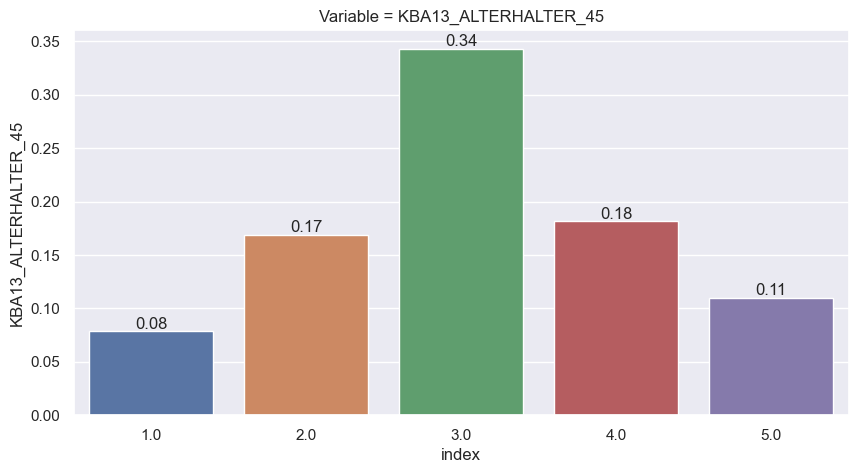

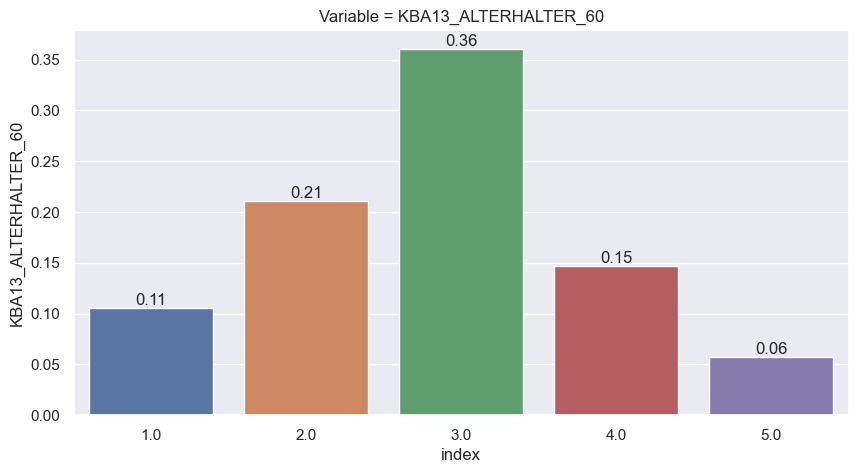

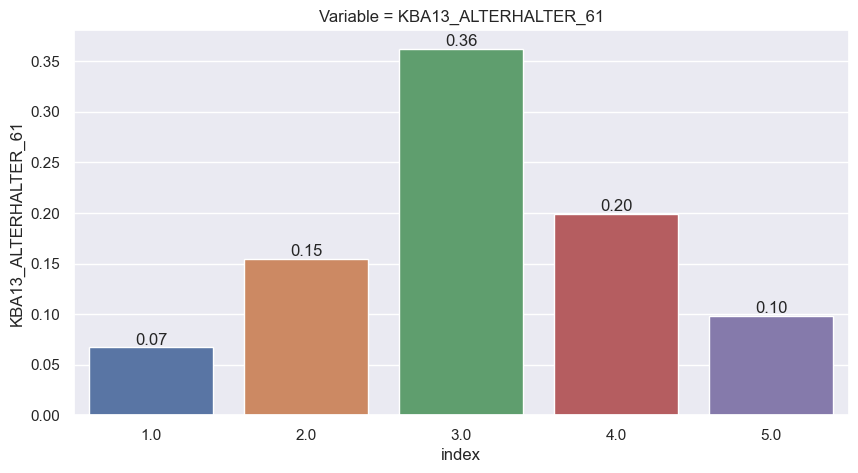

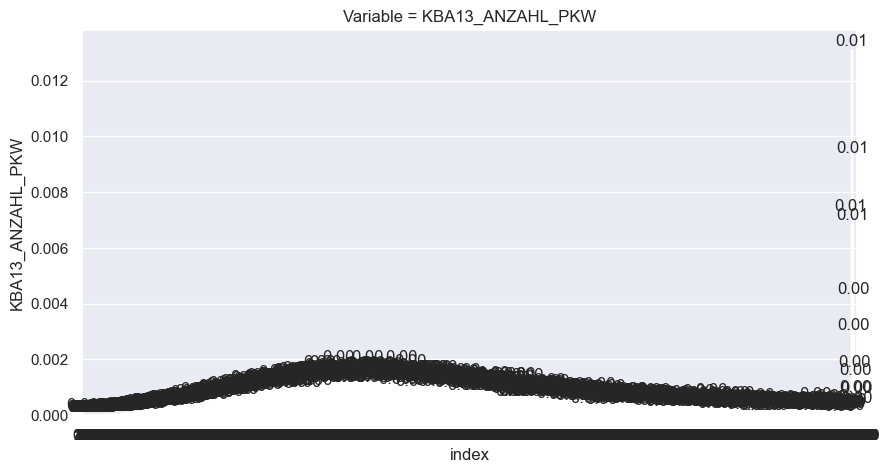

...

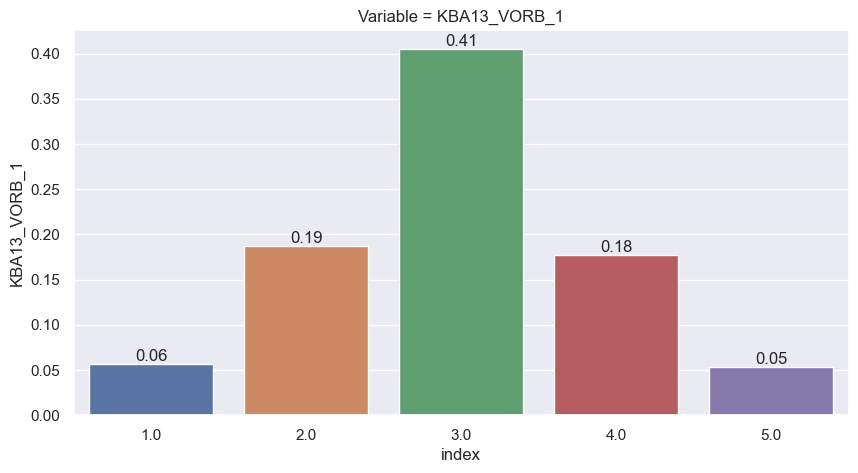

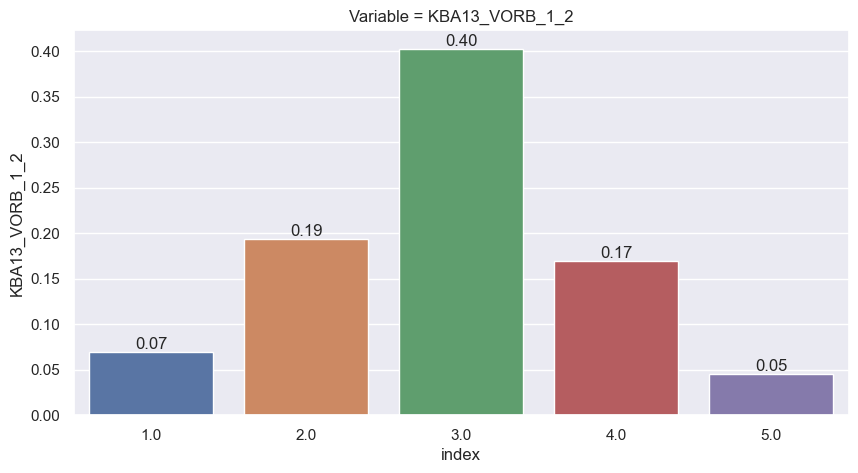

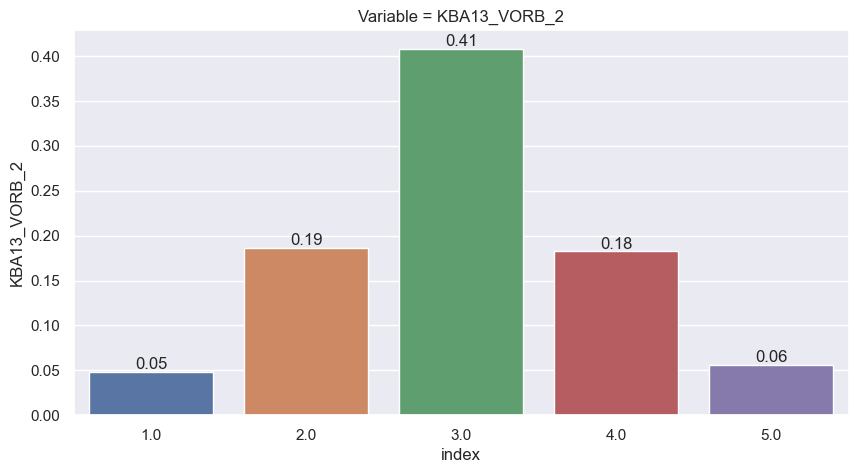

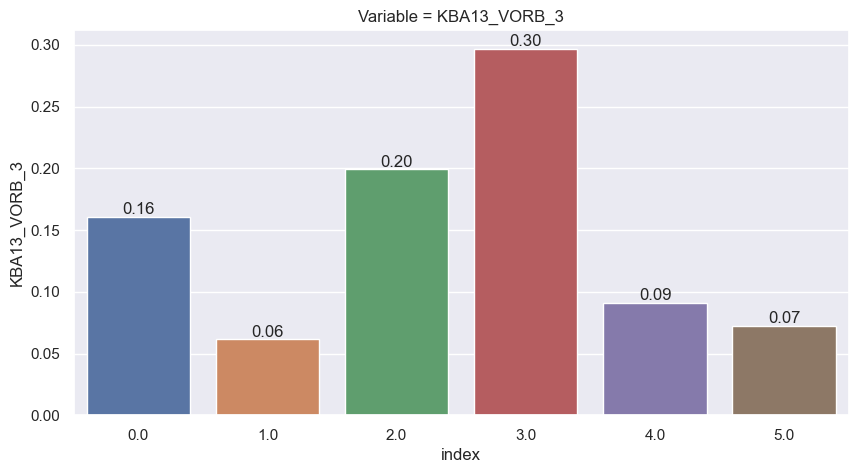

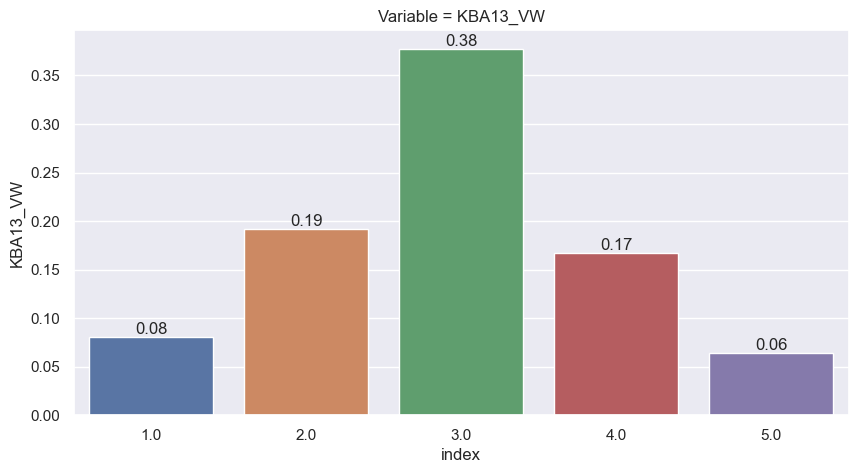

In [113]:
count_val_in_cols(census, sorted([col for col in plz8_col_list if col.startswith('KBA13')]), plot_count = True, normalize = True, dropna = False)

- All owners age-groups (Alterhalter) have similar distributions.
- There are two sets of variables for owner age and max speed of vehicles. Only one set of each variable will be kept, since they convey similar information.
    - For simplicity, sets with fewer variables will be selected

### Are owner age-group columns correlated?
If they are, they contain similar values. 

In [114]:
alterhalter_cols = [col for col in plz8_col_list if 'ALTERHALTER' in col]
halter_cols = [col for col in plz8_col_list if ('HALTER' in col) and ('ALTERHALTER' not in col)]

In [115]:
census[alterhalter_cols].head()

,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61
0,NaN,NaN,NaN,NaN
1,3.0,2.0,3.0,4.0
2,3.0,2.0,3.0,3.0
3,2.0,3.0,5.0,2.0
4,3.0,3.0,3.0,3.0


In [116]:
census[alterhalter_cols].corr(method = 'spearman').style.background_gradient()

,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61
KBA13_ALTERHALTER_30,1.000000,0.236535,-0.167970,-0.430312
KBA13_ALTERHALTER_45,0.236535,1.000000,-0.277544,-0.510131
KBA13_ALTERHALTER_60,-0.167970,-0.277544,1.000000,-0.376098
KBA13_ALTERHALTER_61,-0.430312,-0.510131,-0.376098,1.000000


In [117]:
census[halter_cols].corr(method = 'spearman').style.background_gradient()

,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66
KBA13_HALTER_20,1.000000,0.498930,0.055435,-0.147515,-0.155212,-0.059276,0.387939,0.355141,0.249772,-0.285147,-0.236051
KBA13_HALTER_25,0.498930,1.000000,0.557310,0.250191,-0.026860,-0.266638,0.081806,0.058277,-0.000239,-0.466249,-0.275669
KBA13_HALTER_30,0.055435,0.557310,1.000000,0.707289,0.336890,-0.153503,-0.265030,-0.299805,-0.347642,-0.446085,-0.322271
KBA13_HALTER_35,-0.147515,0.250191,0.707289,1.000000,0.592103,0.069680,-0.305928,-0.382808,-0.449392,-0.336320,-0.354149
KBA13_HALTER_40,-0.155212,-0.026860,0.336890,0.592103,1.000000,0.441102,-0.103004,-0.277625,-0.440266,-0.261423,-0.436120
KBA13_HALTER_45,-0.059276,-0.266638,-0.153503,0.069680,0.441102,1.000000,0.305068,0.065918,-0.207576,-0.157024,-0.405542
KBA13_HALTER_50,0.387939,0.081806,-0.265030,-0.305928,-0.103004,0.305068,1.000000,0.656203,0.347066,-0.328655,-0.449565
KBA13_HALTER_55,0.355141,0.058277,-0.299805,-0.382808,-0.277625,0.065918,0.656203,1.000000,0.566920,-0.165966,-0.356686
KBA13_HALTER_60,0.249772,-0.000239,-0.347642,-0.449392,-0.440266,-0.207576,0.347066,0.566920,1.000000,0.103389,-0.096610
KBA13_HALTER_65,-0.285147,-0.466249,-0.446085,-0.336320,-0.261423,-0.157024,-0.328655,-0.165966,0.103389,1.000000,0.497873


In [118]:
census[alterhalter_cols].isna().mean()

KBA13_ALTERHALTER_30    0.118714
KBA13_ALTERHALTER_45    0.118714
KBA13_ALTERHALTER_60    0.118714
KBA13_ALTERHALTER_61    0.118714
dtype: float64

In [119]:
census[halter_cols].isna().mean()

KBA13_HALTER_20    0.118714
KBA13_HALTER_25    0.118714
KBA13_HALTER_30    0.118714
KBA13_HALTER_35    0.118714
KBA13_HALTER_40    0.118714
KBA13_HALTER_45    0.118714
KBA13_HALTER_50    0.118714
KBA13_HALTER_55    0.118714
KBA13_HALTER_60    0.118714
KBA13_HALTER_65    0.118714
KBA13_HALTER_66    0.118714
dtype: float64

Not necessairly the columns are correlated amongst themselves. This indicates that even though they are generally equally distributed, a line in the file might not have similar categories for all classification.  
This being pointed out, since ALTERHALTER columns convey similar information to HALTER columns, but are less numerous and have a similar amount of NaN values and we already have better proxies for age-groups, the HALTER columns could be dropped.

## Postcode

In [120]:
postcode_col_list = fetch_info_level_columns(att_info_updated, census, 'Postcode')

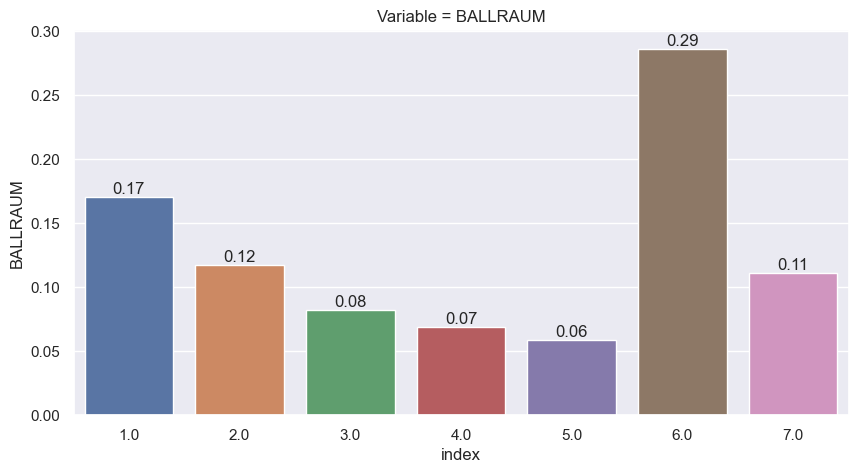

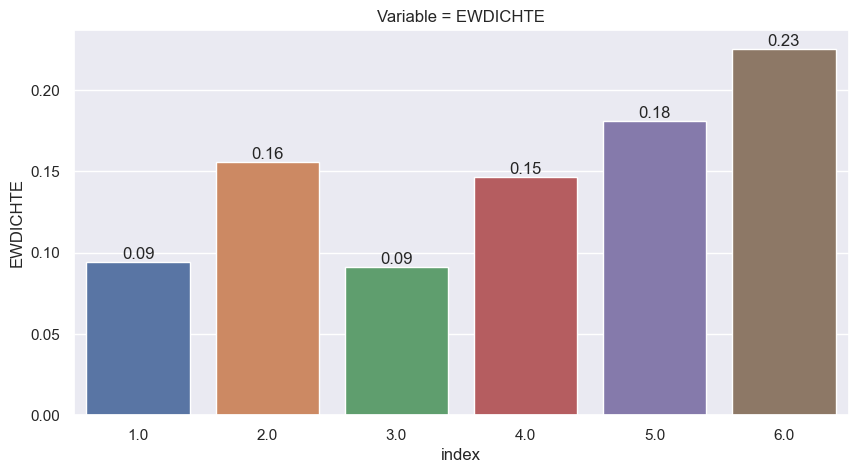

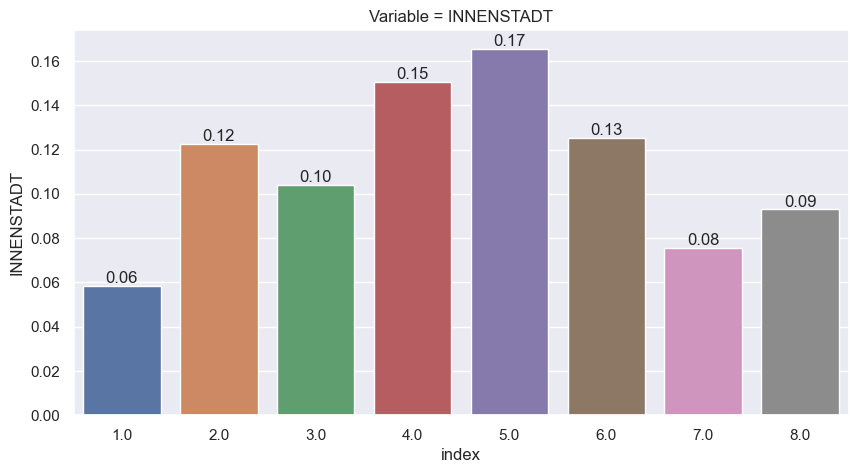

In [121]:
count_val_in_cols(census, postcode_col_list, plot_count = True, normalize = True, dropna = False)

## RR1 Cols

In [122]:
rr1_cols = fetch_info_level_columns(att_info_updated, census, 'RR1_ID')

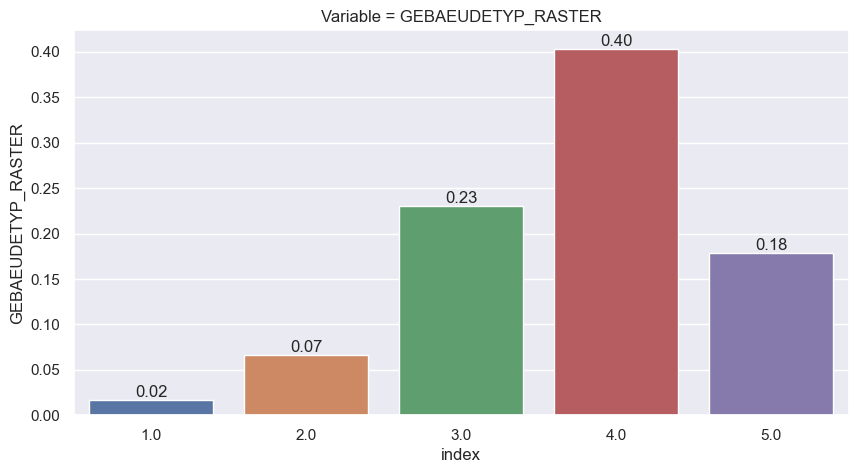

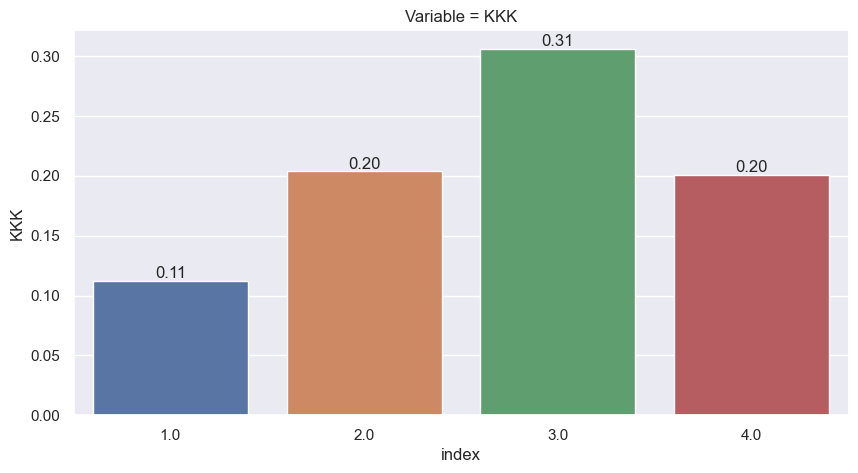

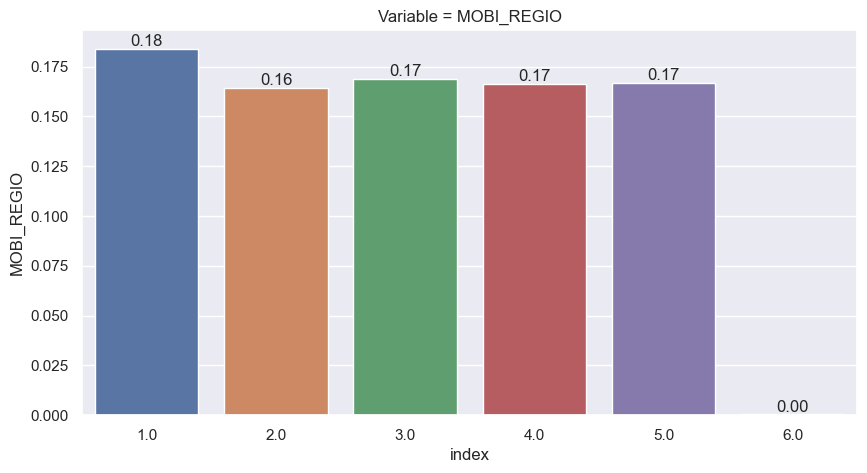

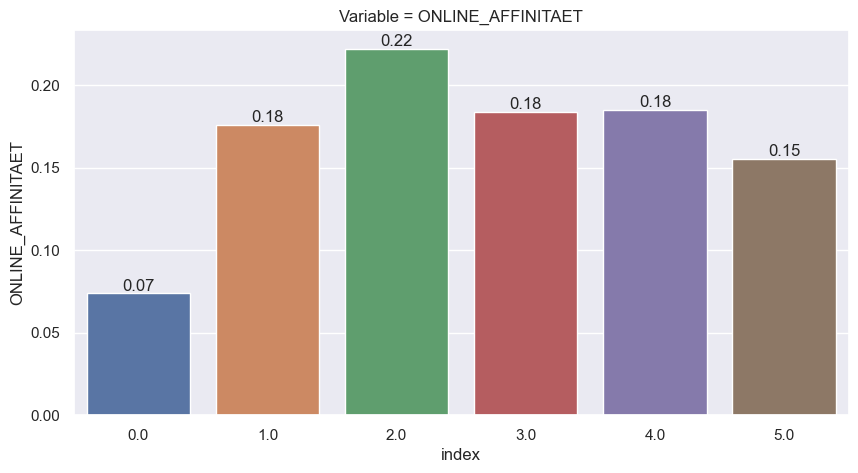

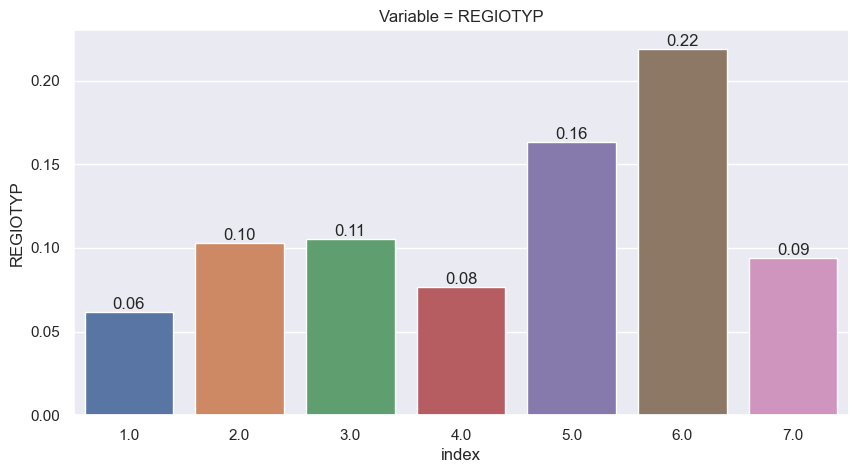

In [123]:
count_val_in_cols(census, rr1_cols, plot_count = True, normalize = True, dropna = False)

# Generating subset for preprocessing

In [124]:
cols_to_drop = ['KBA13_HALTER_20',
                'KBA13_HALTER_25',
                'KBA13_HALTER_30',
                'KBA13_HALTER_35',
                'KBA13_HALTER_40',
                'KBA13_HALTER_45',
                'KBA13_HALTER_50',
                'KBA13_HALTER_55',
                'KBA13_HALTER_60',
                'KBA13_HALTER_65',
                'KBA13_HALTER_66',
                'KBA13_CCM_1400_2500',
                'KBA13_KMH_110',
                'KBA13_KMH_140',
                'KBA13_KMH_180',
                'KBA13_KMH_210',
                'KBA13_KMH_250',
                'KBA13_KMH_251',
                'ALTERSKATEGORIE_FEIN',
                'LP_FAMILIE_FEIN',
                'LP_LEBENSPHASE_FEIN',
                'LP_STATUS_FEIN']

In [125]:
census.drop(columns = cols_to_drop, inplace = True)

In [138]:
census.dtypes[census.dtypes == object]

CAMEO_DEU_2015                 object
D19_LETZTER_KAUF_BRANCHE_RZ    object
OST_WEST_KZ                    object
dtype: object

# Exports
Everything is exported to trusted layer for usage in preprocessing

## Data

In [126]:
census.to_parquet('data/trusted/census_subset.parquet')

## Columns with too many NaNs

In [148]:
list(nan_proportion[nan_proportion >= 0.3].index)

['ALTER_KIND4',
 'TITEL_KZ',
 'ALTER_KIND3',
 'ALTER_KIND2',
 'ALTER_KIND1',
 'AGER_TYP',
 'D19_KK_KUNDENTYP',
 'KBA05_BAUMAX',
 'ALTER_HH']

## Kept Cols

In [127]:
kept_cols_series = pd.Series(census.columns)

kept_cols_series.to_csv('data/trusted/kept_cols_list.csv', index = False)

## Variable Groups

In [134]:
att_info_updated.to_csv('data/trusted/var_group_list.csv', index = False)

## Col Dtypes

In [155]:
census_var_types['Type'].unique()

array(['nominal', 'interval', 'binary', 'numeric'], dtype=object)

In [156]:
dtype_map = {'nominal':'int',
                'interval':'int',
                'binary':'int',
                'numeric':'float'}

In [157]:
census_var_types['dtype'] = census_var_types['Type'].map(dtype_map)

In [158]:
census_var_types.head()

,Attribute,Type,dtype
0,AGER_TYP,nominal,int
5,ALTERSKATEGORIE_GROB,interval,int
11,ALTER_HH,interval,int
33,ANREDE_KZ,binary,int
36,ANZ_HAUSHALTE_AKTIV,numeric,float


In [172]:
census_var_types.loc[census_var_types['Attribute'] == 'D19_LETZTER_KAUF_BRANCHE_RZ','dtype'] = 'str'

In [173]:
census_var_types.to_csv('data/trusted/var_type_list.csv', index = False)